In [1]:
import libpysal
import segregation
import geopandas as gpd
import matplotlib.pyplot as plt
from segregation.local import MultiLocationQuotient, MultiLocalDiversity, MultiLocalEntropy, MultiLocalSimpsonInteraction, MultiLocalSimpsonConcentration, LocalRelativeCentralization
from cenpy import products
%matplotlib inline

In [2]:
oakland13= products.ACS(2013).from_place('Oakland, CA', level='tract',variables=['B02001','B03001','B25121','B06009'])
oakland15= products.ACS(2015).from_place('Oakland, CA', level='tract',variables=['B02001','B03001','B25121','B06009'])
oakland17= products.ACS(2017).from_place('Oakland, CA', level='tract',variables=['B02001','B03001','B25121','B06009'])
oakland19= products.ACS(2019).from_place('Oakland, CA', level='tract',variables=['B02001','B03001','B25121','B06009'])

/opt/conda/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


Matched: Oakland, CA to Oakland city within layer Incorporated Places


/opt/conda/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


Matched: Oakland, CA to Oakland city within layer Incorporated Places


/opt/conda/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


Matched: Oakland, CA to Oakland city within layer Incorporated Places


/opt/conda/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


Matched: Oakland, CA to Oakland city within layer Incorporated Places


In [ ]:
#TotalPop= B02001_001E
#Black = B02001_003E
#White = B02001_002E
#Hispanic = B03001_003E

#TotalIncome =B25121_001E
#<10,000 = B25121_002E
#10-19= B25121_017E
#20-34= B25121_032E
#35-49= B25121_047E
#50-74= B25121_062E
#75-99= B25121_077E
#100+= B25121_092E

#TotalEdu= B06009_001E
#<Highschool = B06009_002E
#Highschool= B06009_003E
#Bachelors=B06009_005E
#Grad= B06009_006E

In [3]:
#Need to combine for low and middle income
oakland13['low_in']= oakland13['B25121_002E']+oakland13['B25121_017E']+oakland13['B25121_032E']
oakland13['mid_in'] = oakland13['B25121_047E']+oakland13['B25121_062E']+oakland13['B25121_077E']
oakland15['low_in']= oakland15['B25121_002E']+oakland15['B25121_017E']+oakland15['B25121_032E']
oakland15['mid_in'] = oakland15['B25121_047E']+oakland15['B25121_062E']+oakland15['B25121_077E']
oakland17['low_in']= oakland17['B25121_002E']+oakland17['B25121_017E']+oakland17['B25121_032E']
oakland17['mid_in'] = oakland17['B25121_047E']+oakland17['B25121_062E']+oakland17['B25121_077E']
oakland19['low_in']= oakland19['B25121_002E']+oakland19['B25121_017E']+oakland19['B25121_032E']
oakland19['mid_in'] = oakland19['B25121_047E']+oakland19['B25121_062E']+oakland19['B25121_077E']
#Combine for Highschool or less and Bachelors or higher
oakland13['HS_max']= oakland13['B06009_002E']+oakland13['B06009_003E']
oakland13['BD_min'] = oakland13['B06009_005E']+oakland13['B06009_006E']
oakland15['HS_max']= oakland15['B06009_002E']+oakland15['B06009_003E']
oakland15['BD_min'] = oakland15['B06009_005E']+oakland15['B06009_006E']
oakland17['HS_max']= oakland17['B06009_002E']+oakland17['B06009_003E']
oakland17['BD_min'] = oakland17['B06009_005E']+oakland17['B06009_006E']
oakland19['HS_max']= oakland19['B06009_002E']+oakland19['B06009_003E']
oakland19['BD_min'] = oakland19['B06009_005E']+oakland19['B06009_006E']

In [4]:
oakland13.head()

,GEOID,geometry,B02001_001E,B02001_002E,B02001_003E,B02001_004E,B02001_005E,B02001_006E,B02001_007E,B02001_008E,...,B25121_101E,B25121_102E,B25121_103E,B25121_104E,B25121_105E,B25121_106E,low_in,mid_in,HS_max,BD_min
0,06001402600,"POLYGON ((-13612515.470 4551456.620, -13612510...",955.0,143.0,238.0,5.0,545.0,0.0,17.0,7.0,...,0.0,0.0,0.0,0.0,40.0,5.0,13.0,44.0,405.0,275.0
1,06001401600,"POLYGON ((-13613223.790 4553606.490, -13613162...",1889.0,546.0,960.0,5.0,247.0,38.0,30.0,63.0,...,0.0,0.0,0.0,20.0,44.0,0.0,32.0,44.0,595.0,242.0
2,06001402900,"POLYGON ((-13611175.960 4551825.330, -13611160...",1254.0,369.0,185.0,21.0,585.0,0.0,38.0,56.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,463.0,359.0
3,06001403501,"POLYGON ((-13610674.690 4552838.670, -13610631...",4178.0,1381.0,1290.0,38.0,1043.0,0.0,52.0,374.0,...,0.0,0.0,27.0,30.0,114.0,24.0,37.0,70.0,837.0,1506.0
4,06001403400,"POLYGON ((-13610725.340 4551382.940, -13610696...",4318.0,1523.0,941.0,36.0,1074.0,0.0,359.0,385.0,...,0.0,0.0,0.0,0.0,103.0,37.0,45.0,122.0,945.0,1837.0


Text(0.5, 1.0, 'Total Black 2019')

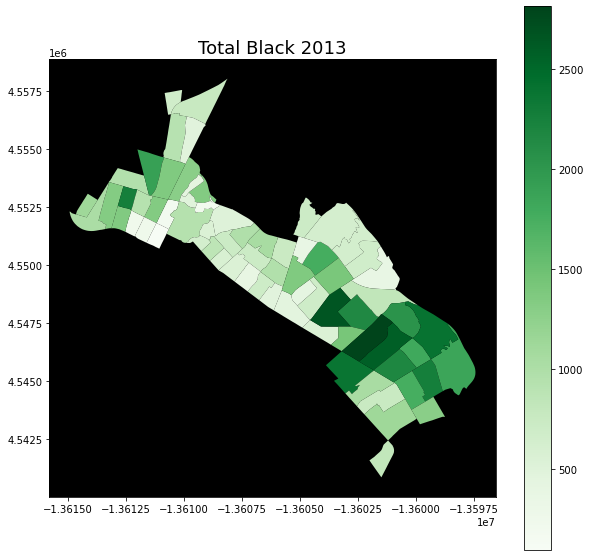

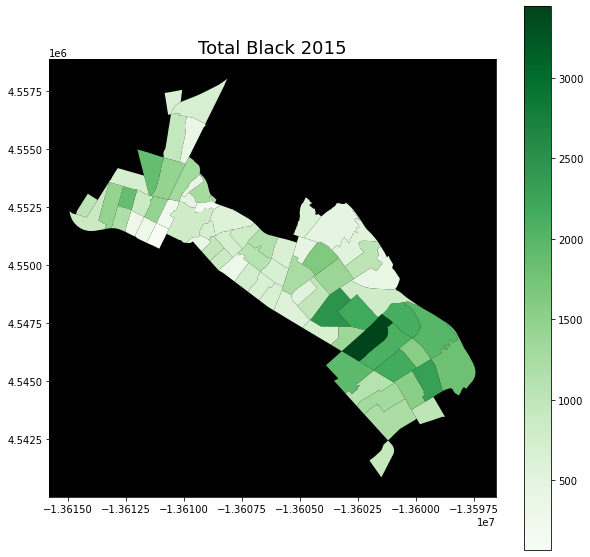

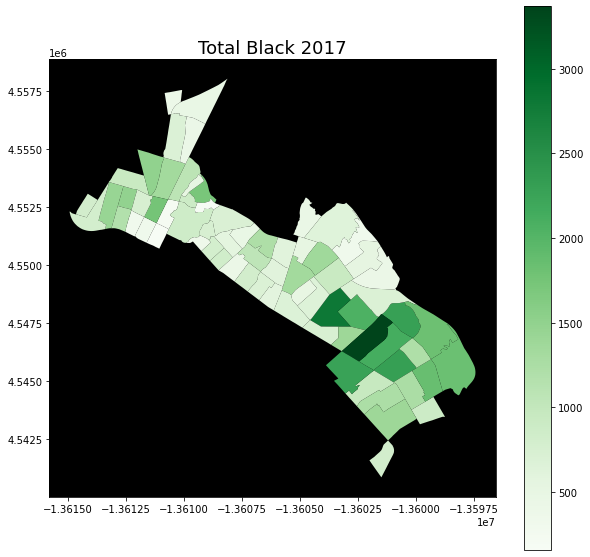

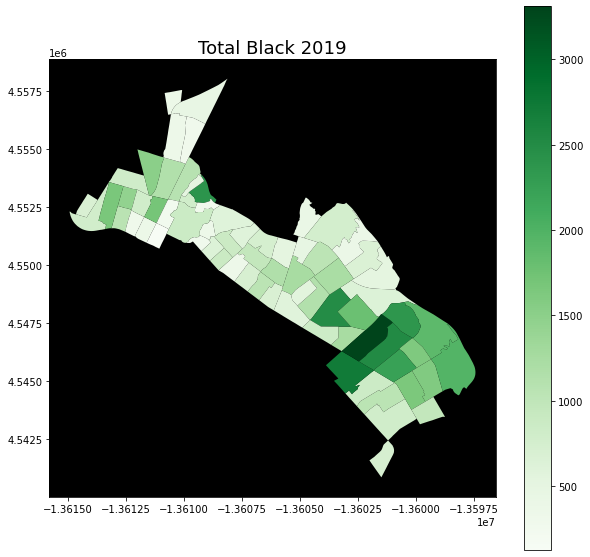

In [5]:
#Black
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.dropna(subset=['B02001_003E'], axis=0).plot('B02001_003E', ax=ax, cmap='Greens',legend=True)
ax.set_facecolor('k')
ax.set_title('Total Black 2013', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.dropna(subset=['B02001_003E'], axis=0).plot('B02001_003E', ax=ax, cmap='Greens',legend=True)
ax.set_facecolor('k')
ax.set_title('Total Black 2015', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.dropna(subset=['B02001_003E'], axis=0).plot('B02001_003E', ax=ax, cmap='Greens',legend=True)
ax.set_facecolor('k')
ax.set_title('Total Black 2017', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.dropna(subset=['B02001_003E'], axis=0).plot('B02001_003E', ax=ax, cmap='Greens',legend=True)
ax.set_facecolor('k')
ax.set_title('Total Black 2019', fontsize = 18)

Text(0.5, 1.0, 'Total White 2019')

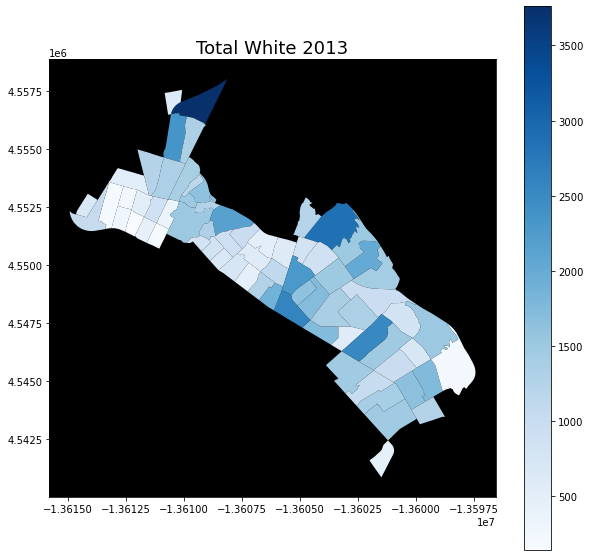

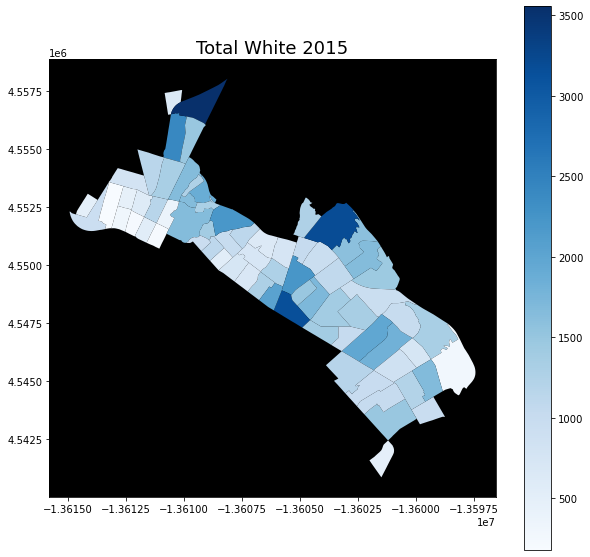

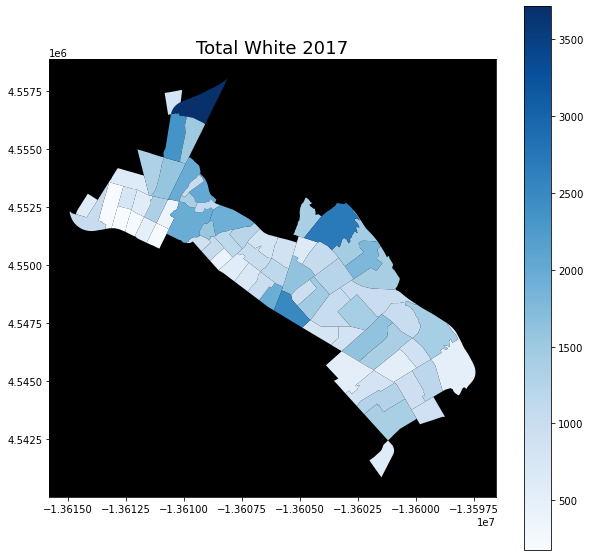

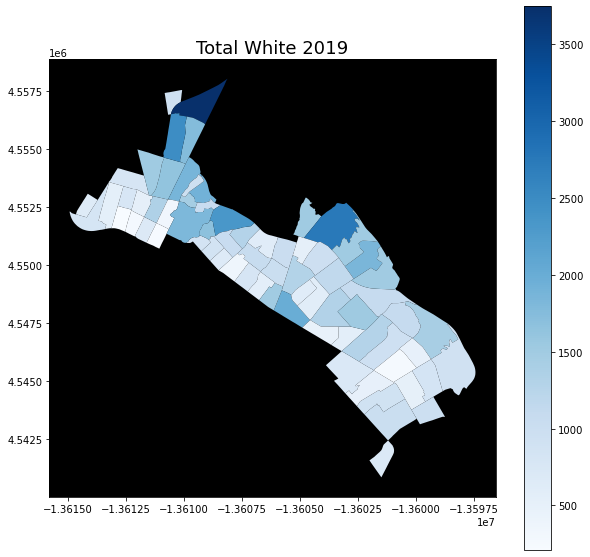

In [6]:
# White
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.dropna(subset=['B02001_002E'], axis=0).plot('B02001_002E', ax=ax, cmap='Blues',legend=True)
ax.set_facecolor('k')
ax.set_title('Total White 2013', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.dropna(subset=['B02001_002E'], axis=0).plot('B02001_002E', ax=ax, cmap='Blues',legend=True)
ax.set_facecolor('k')
ax.set_title('Total White 2015', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.dropna(subset=['B02001_002E'], axis=0).plot('B02001_002E', ax=ax, cmap='Blues',legend=True)
ax.set_facecolor('k')
ax.set_title('Total White 2017', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.dropna(subset=['B02001_002E'], axis=0).plot('B02001_002E', ax=ax, cmap='Blues',legend=True)
ax.set_facecolor('k')
ax.set_title('Total White 2019', fontsize = 18)

Text(0.5, 1.0, 'Total Hispanic 2019')

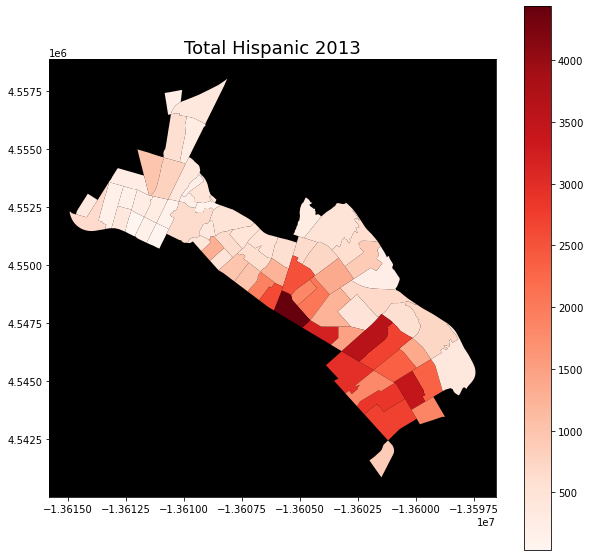

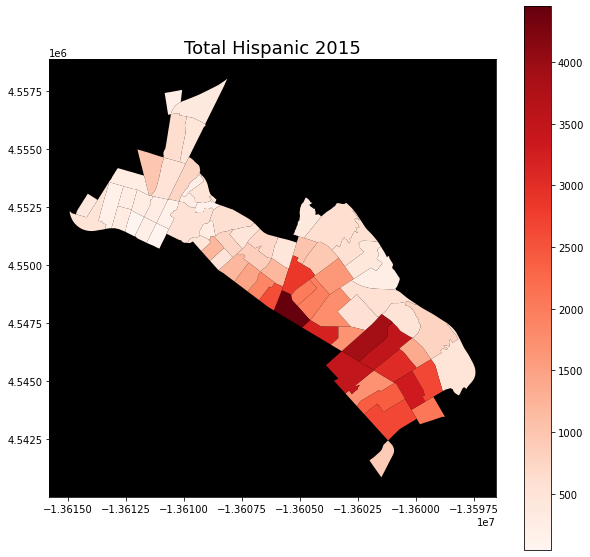

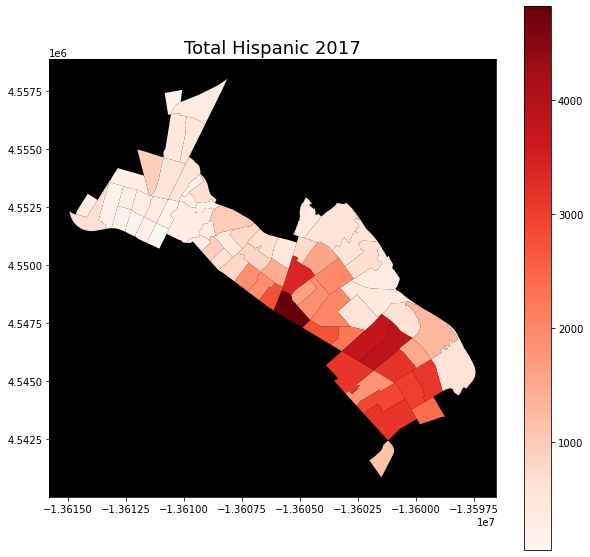

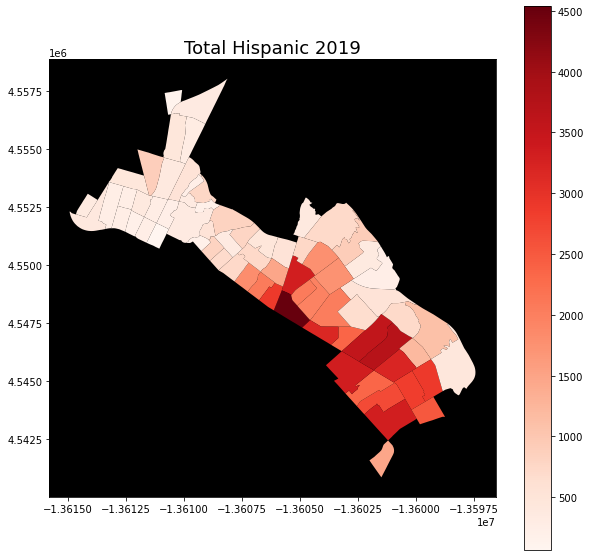

In [7]:
#Hispanic
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.dropna(subset=['B03001_003E'], axis=0).plot('B03001_003E', ax=ax, cmap='Reds',legend=True)
ax.set_facecolor('k')
ax.set_title('Total Hispanic 2013', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.dropna(subset=['B03001_003E'], axis=0).plot('B03001_003E', ax=ax, cmap='Reds',legend=True)
ax.set_facecolor('k')
ax.set_title('Total Hispanic 2015', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.dropna(subset=['B03001_003E'], axis=0).plot('B03001_003E', ax=ax, cmap='Reds',legend=True)
ax.set_facecolor('k')
ax.set_title('Total Hispanic 2017', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.dropna(subset=['B03001_003E'], axis=0).plot('B03001_003E', ax=ax, cmap='Reds',legend=True)
ax.set_facecolor('k')
ax.set_title('Total Hispanic 2019', fontsize = 18)

Text(0.5, 1.0, 'Income 2019')

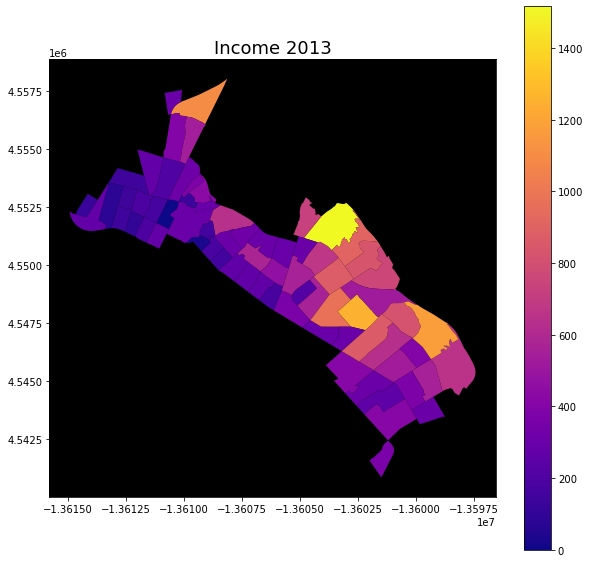

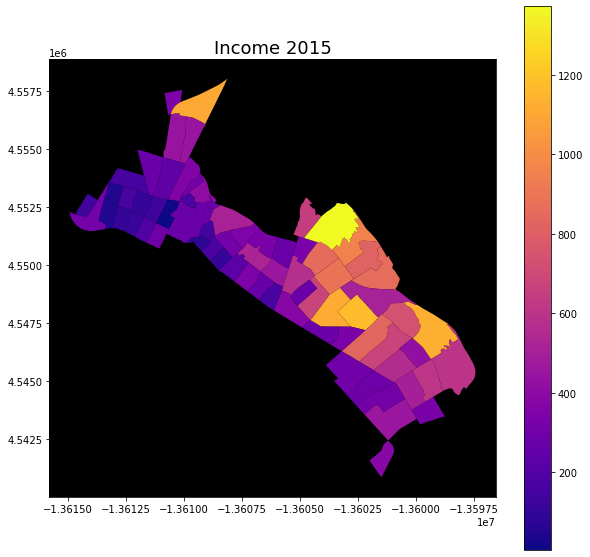

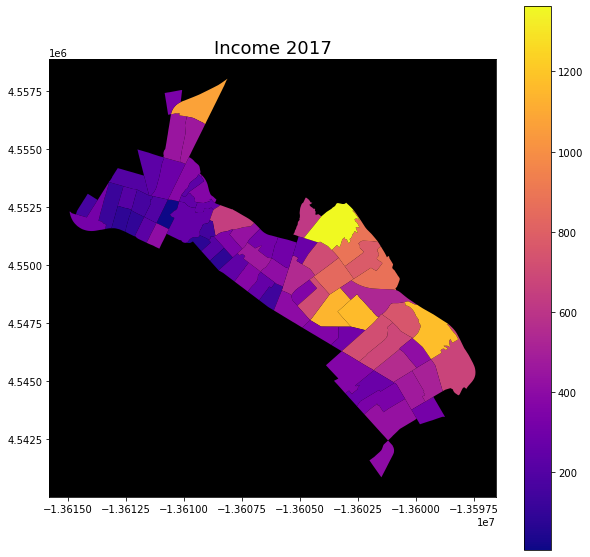

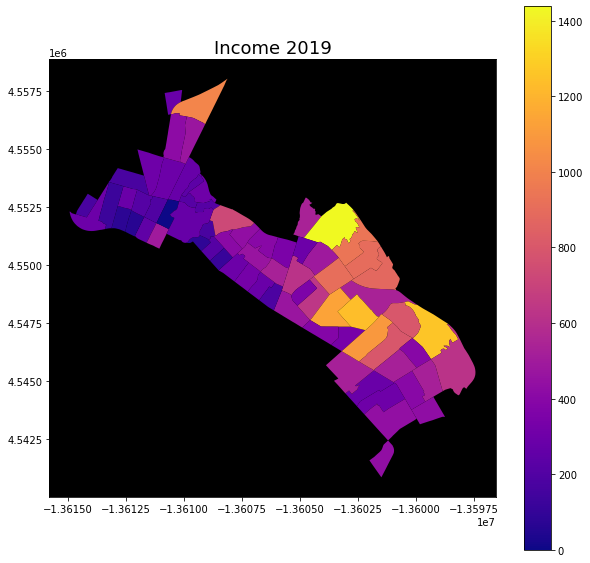

In [8]:
#Income
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.dropna(subset=['B25121_001E'], axis=0).plot('B25121_001E', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Income 2013', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.dropna(subset=['B25121_001E'], axis=0).plot('B25121_001E', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Income 2015', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.dropna(subset=['B25121_001E'], axis=0).plot('B25121_001E', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Income 2017', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.dropna(subset=['B25121_001E'], axis=0).plot('B25121_001E', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Income 2019', fontsize = 18)

Text(0.5, 1.0, 'Low Income 2019')

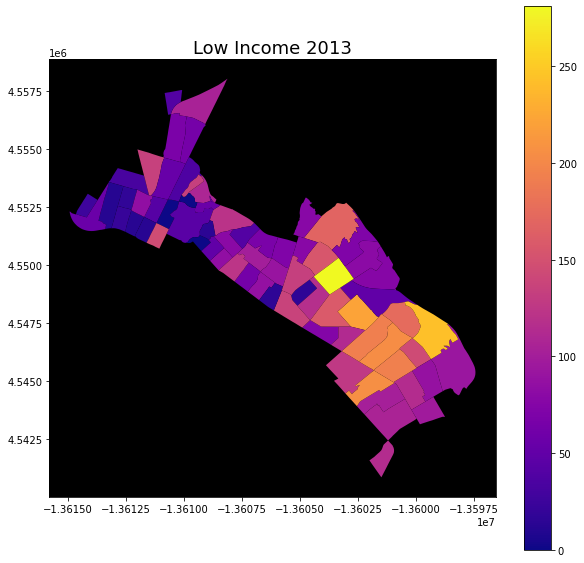

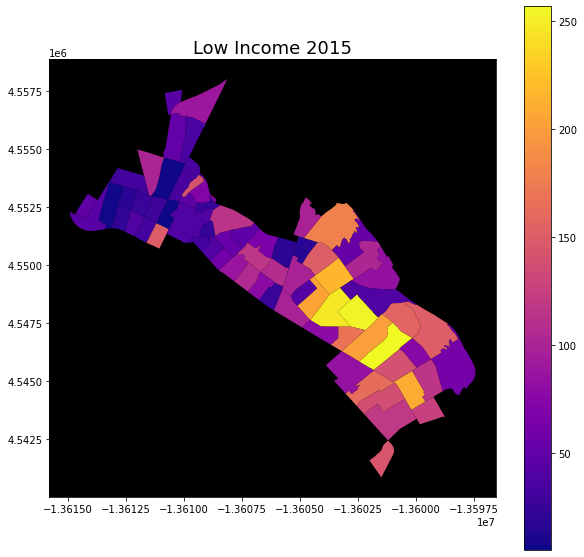

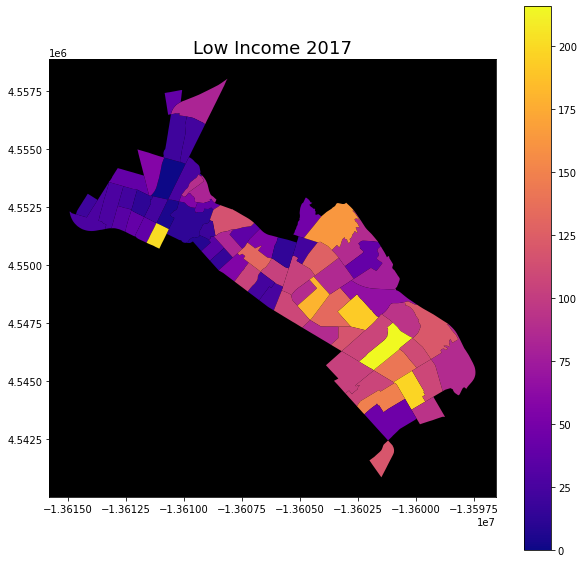

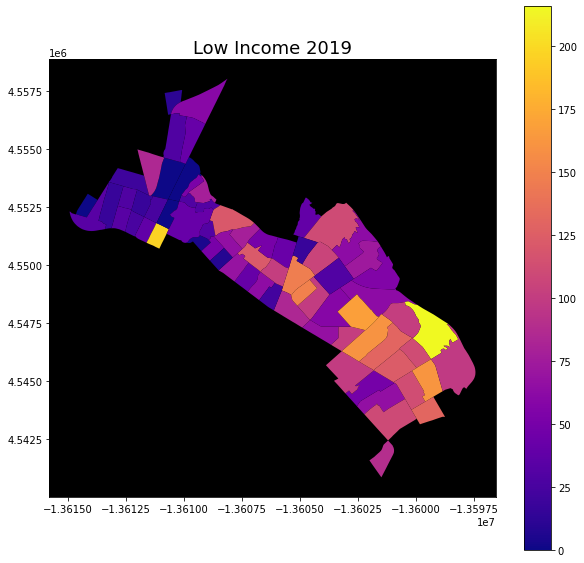

In [9]:

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.dropna(subset=['low_in'], axis=0).plot('low_in', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Low Income 2013', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.dropna(subset=['low_in'], axis=0).plot('low_in', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Low Income 2015', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.dropna(subset=['low_in'], axis=0).plot('low_in', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Low Income 2017', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.dropna(subset=['low_in'], axis=0).plot('low_in', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Low Income 2019', fontsize = 18)

Text(0.5, 1.0, 'Middle Income 2019')

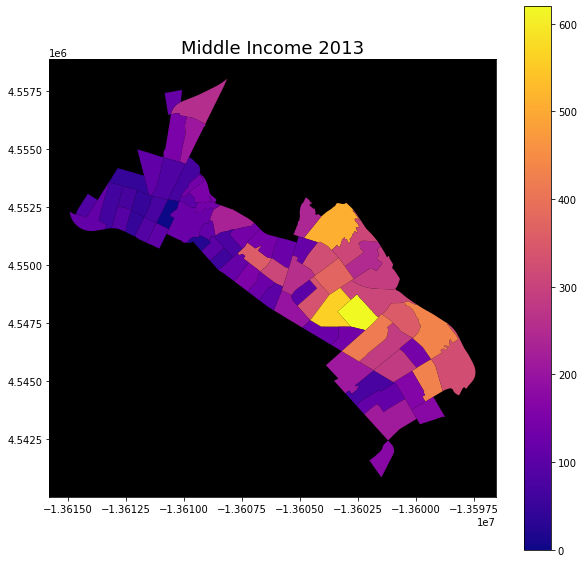

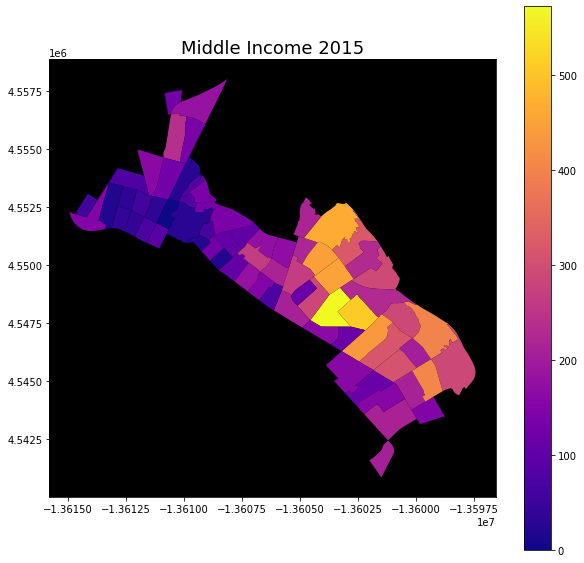

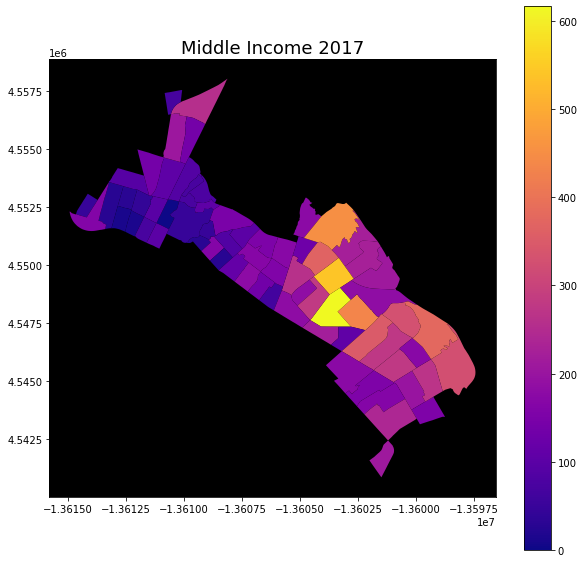

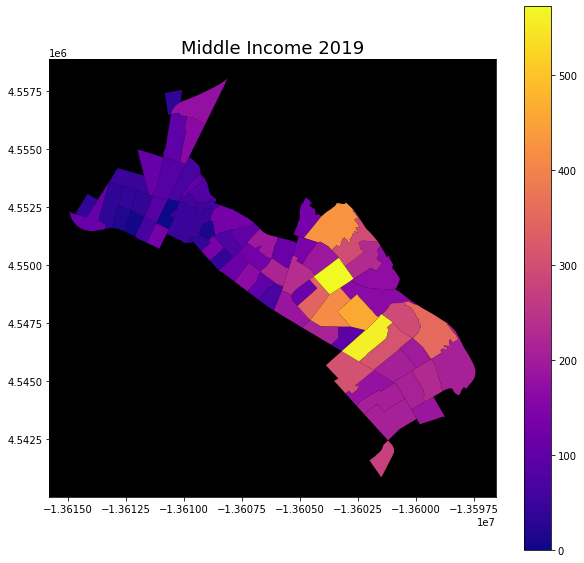

In [10]:
#middle income
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.dropna(subset=['mid_in'], axis=0).plot('mid_in', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Middle Income 2013', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.dropna(subset=['mid_in'], axis=0).plot('mid_in', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Middle Income 2015', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.dropna(subset=['mid_in'], axis=0).plot('mid_in', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Middle Income 2017', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.dropna(subset=['mid_in'], axis=0).plot('mid_in', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Middle Income 2019', fontsize = 18)

Text(0.5, 1.0, 'High Income 2019')

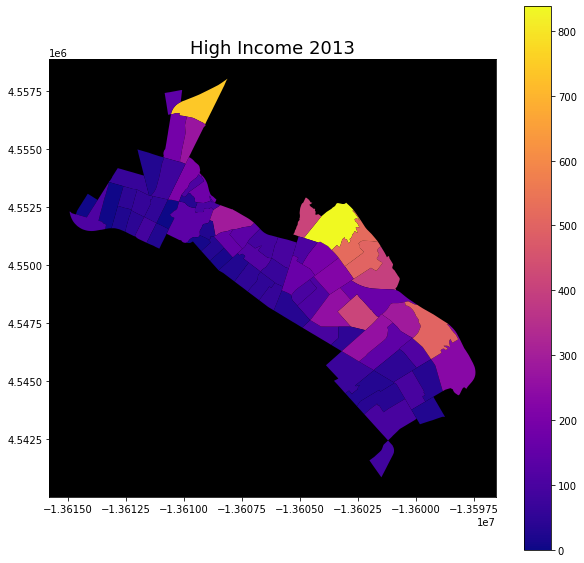

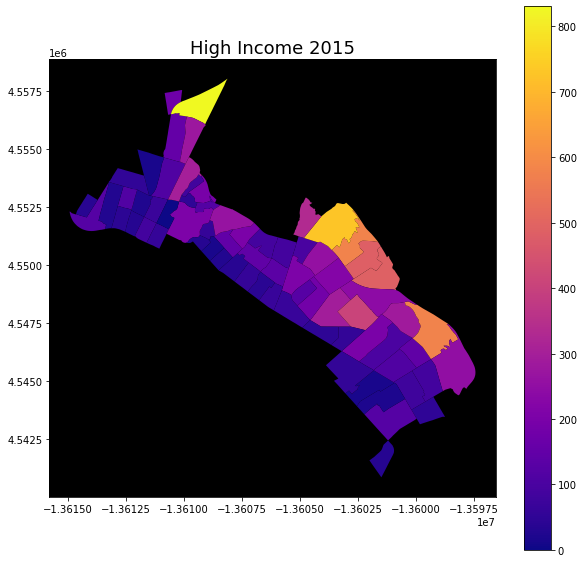

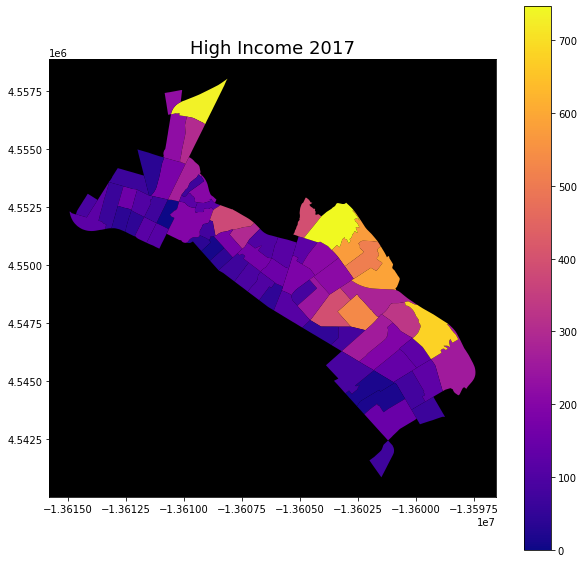

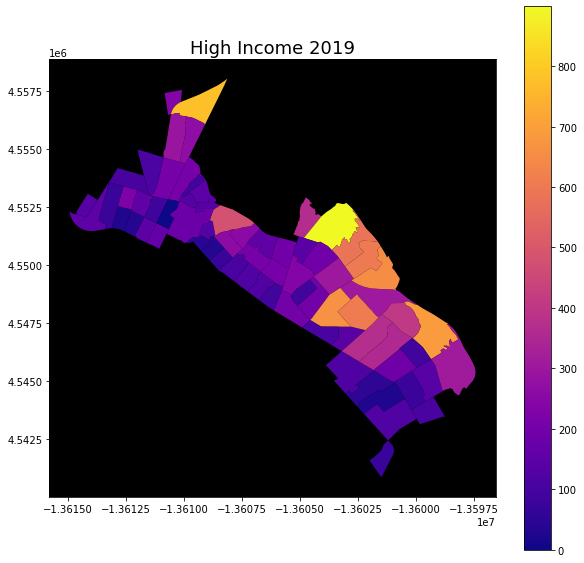

In [12]:
#High income
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.dropna(subset=['B25121_092E'], axis=0).plot('B25121_092E', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('High Income 2013', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.dropna(subset=['B25121_092E'], axis=0).plot('B25121_092E', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('High Income 2015', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.dropna(subset=['B25121_092E'], axis=0).plot('B25121_092E', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('High Income 2017', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.dropna(subset=['B25121_092E'], axis=0).plot('B25121_092E', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('High Income 2019', fontsize = 18)

Text(0.5, 1.0, 'High School or Less 2019')

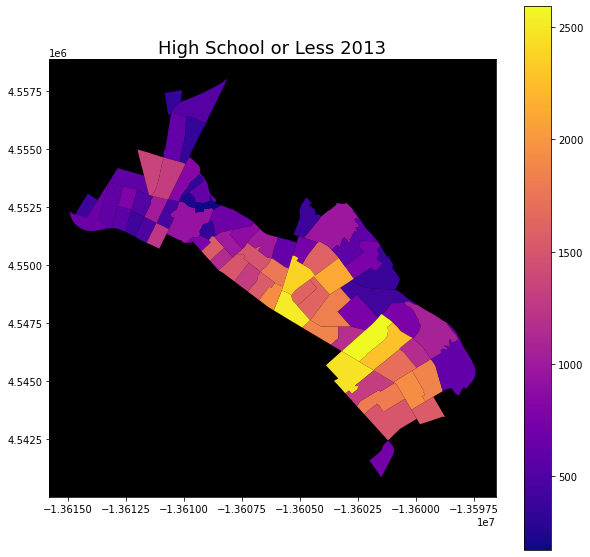

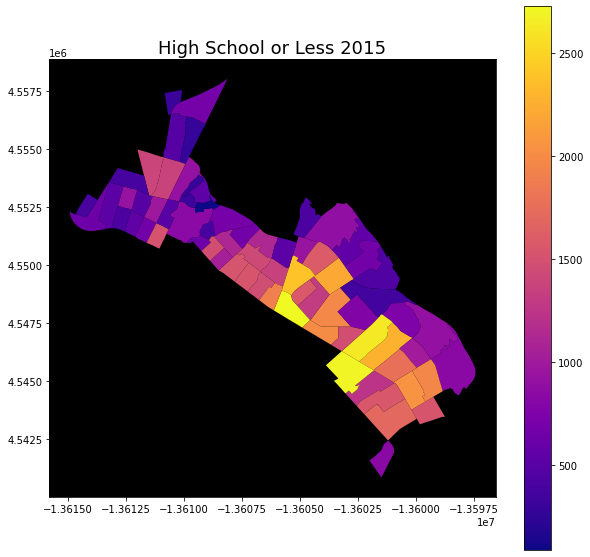

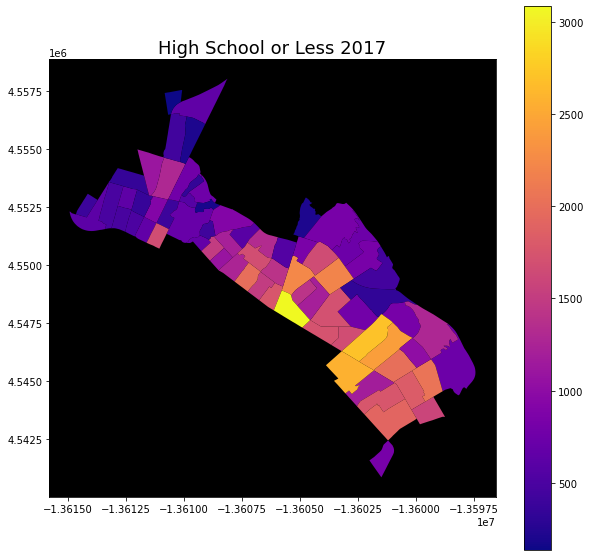

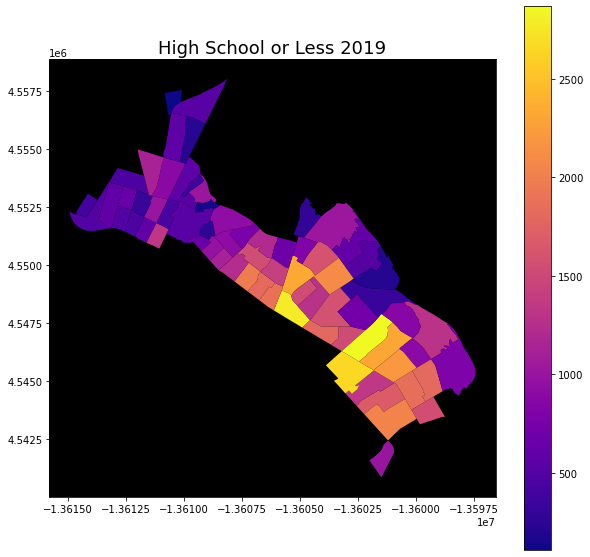

In [13]:
#Education Status
#Highschool or lower
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.dropna(subset=['HS_max'], axis=0).plot('HS_max', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('High School or Less 2013', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.dropna(subset=['HS_max'], axis=0).plot('HS_max', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('High School or Less 2015', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.dropna(subset=['HS_max'], axis=0).plot('HS_max', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('High School or Less 2017', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.dropna(subset=['HS_max'], axis=0).plot('HS_max', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('High School or Less 2019', fontsize = 18)

Text(0.5, 1.0, 'Bachelor or Greater 2019')

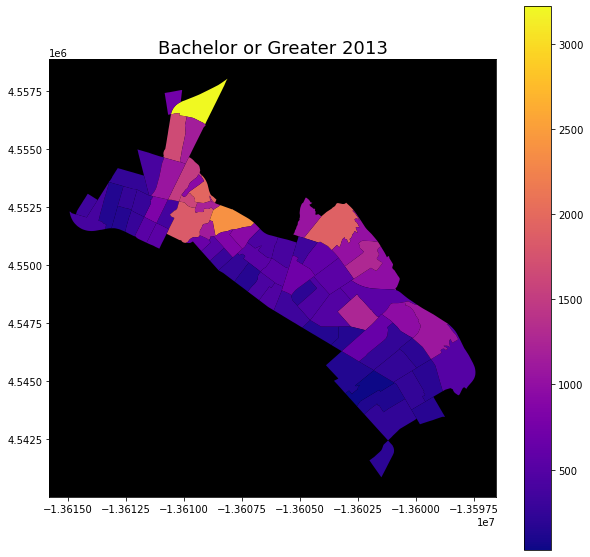

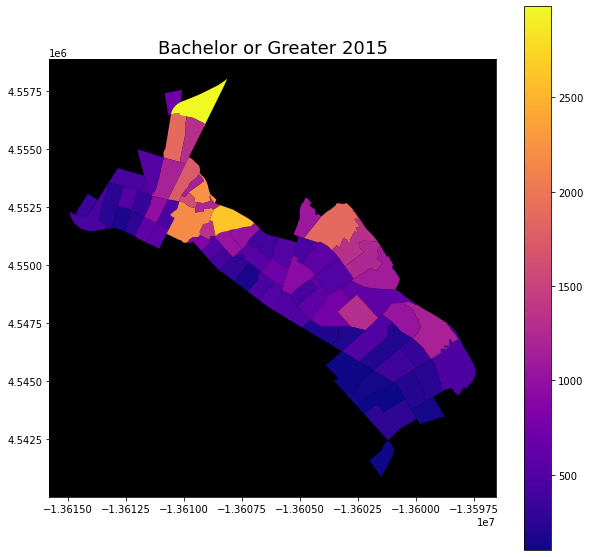

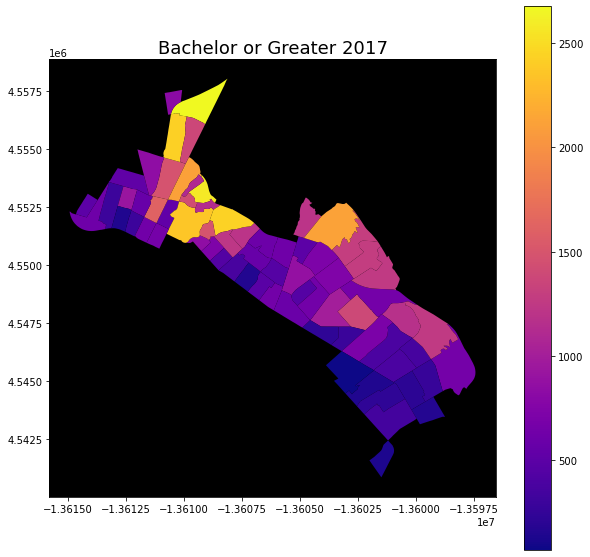

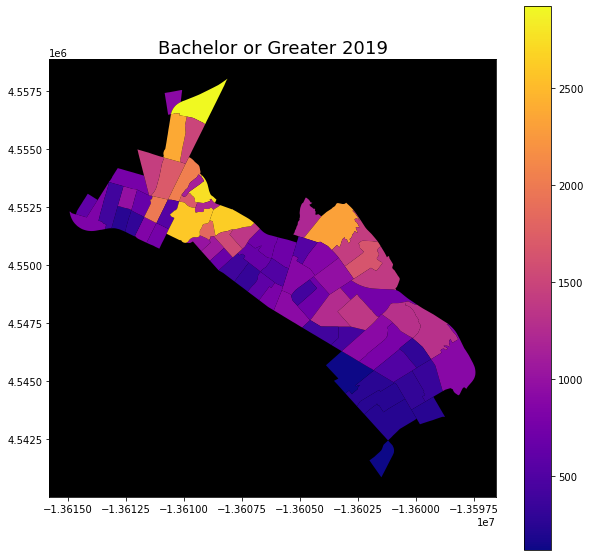

In [14]:
#Bachelor or higher
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.dropna(subset=['BD_min'], axis=0).plot('BD_min', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Bachelor or Greater 2013', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.dropna(subset=['BD_min'], axis=0).plot('BD_min', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Bachelor or Greater 2015', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.dropna(subset=['BD_min'], axis=0).plot('BD_min', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Bachelor or Greater 2017', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.dropna(subset=['BD_min'], axis=0).plot('BD_min', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Bachelor or Greater 2019', fontsize = 18)

In [7]:
#Segregation
print(oakland19.head())
oakland19['B03001_001E'].head()

         GEOID                                           geometry  \
0  06001403100  POLYGON ((-13612098.800 4551274.180, -13612084...   
1  06001400600  POLYGON ((-13610819.290 4557430.800, -13610795...   
2  06001405302  POLYGON ((-13609867.960 4551004.670, -13609867...   
3  06001405901  POLYGON ((-13607802.090 4549318.190, -13607776...   
4  06001406201  POLYGON ((-13607238.140 4548873.930, -13607195...   

   B01003_001E  B02001_001E  B02001_002E  B02001_003E  B02001_004E  \
0       2101.0       2101.0        698.0        376.0          6.0   
1       1745.0       1745.0        936.0        375.0          3.0   
2       2373.0       2373.0        861.0        312.0          8.0   
3       4426.0       4426.0        813.0        716.0         61.0   
4       4995.0       4995.0        567.0       1056.0         79.0   

   B02001_005E  B02001_006E  B02001_007E  ...  B25121_097E  B25121_098E  \
0        807.0         12.0        104.0  ...          0.0          0.0   
1        193.0

0    2101.0
1    1745.0
2    2373.0
3    4426.0
4    4995.0
Name: B03001_001E, dtype: float64

In [15]:
#Composition
#white
oakland13['white_com']=oakland13['B02001_002E']/oakland13['B02001_001E']
oakland15['white_com']=oakland15['B02001_002E']/oakland15['B02001_001E']
oakland17['white_com']=oakland17['B02001_002E']/oakland17['B02001_001E']
oakland19['white_com']=oakland19['B02001_002E']/oakland19['B02001_001E']
#black
oakland13['black_com']=oakland13['B02001_003E']/oakland13['B02001_001E']
oakland15['black_com']=oakland15['B02001_003E']/oakland15['B02001_001E']
oakland17['black_com']=oakland17['B02001_003E']/oakland17['B02001_001E']
oakland19['black_com']=oakland19['B02001_003E']/oakland19['B02001_001E']
#hispanic
oakland13['hisp_com']=oakland13['B03001_003E']/oakland13['B02001_001E']
oakland15['hisp_com']=oakland15['B03001_003E']/oakland15['B02001_001E']
oakland17['hisp_com']=oakland17['B03001_003E']/oakland17['B02001_001E']
oakland19['hisp_com']=oakland19['B03001_003E']/oakland19['B02001_001E']
#low income
oakland13['low_com']=oakland13['low_in']/oakland13['B25121_001E']
oakland15['low_com']=oakland15['low_in']/oakland15['B25121_001E']
oakland17['low_com']=oakland17['low_in']/oakland17['B25121_001E']
oakland19['low_com']=oakland19['low_in']/oakland19['B25121_001E']
#middle income
oakland13['mid_com']=oakland13['mid_in']/oakland13['B25121_001E']
oakland15['mid_com']=oakland15['mid_in']/oakland15['B25121_001E']
oakland17['mid_com']=oakland17['mid_in']/oakland17['B25121_001E']
oakland19['mid_com']=oakland19['mid_in']/oakland19['B25121_001E']
#high income
oakland13['high_com']=oakland13['B25121_092E']/oakland13['B25121_001E']
oakland15['high_com']=oakland15['B25121_092E']/oakland15['B25121_001E']
oakland17['high_com']=oakland17['B25121_092E']/oakland17['B25121_001E']
oakland19['high_com']=oakland19['B25121_092E']/oakland19['B25121_001E']
#hs or less
oakland13['HS_com']=oakland13['HS_max']/oakland13['B06009_001E']
oakland15['HS_com']=oakland15['HS_max']/oakland15['B06009_001E']
oakland17['HS_com']=oakland17['HS_max']/oakland17['B06009_001E']
oakland19['HS_com']=oakland19['HS_max']/oakland19['B06009_001E']
#BD or greater
oakland13['BD_com']=oakland13['BD_min']/oakland13['B06009_001E']
oakland15['BD_com']=oakland15['BD_min']/oakland15['B06009_001E']
oakland17['BD_com']=oakland17['BD_min']/oakland17['B06009_001E']
oakland19['BD_com']=oakland19['BD_min']/oakland19['B06009_001E']

Text(0.5, 1.0, 'Composition of White 2019')

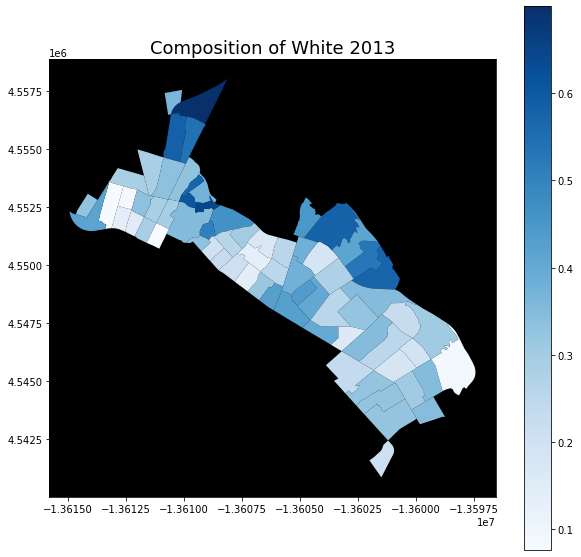

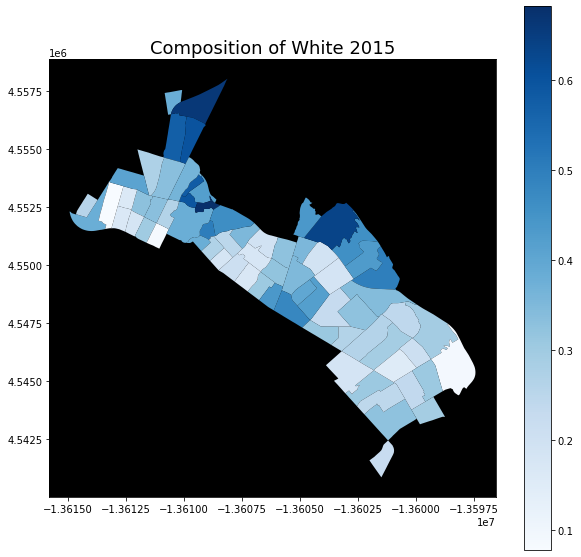

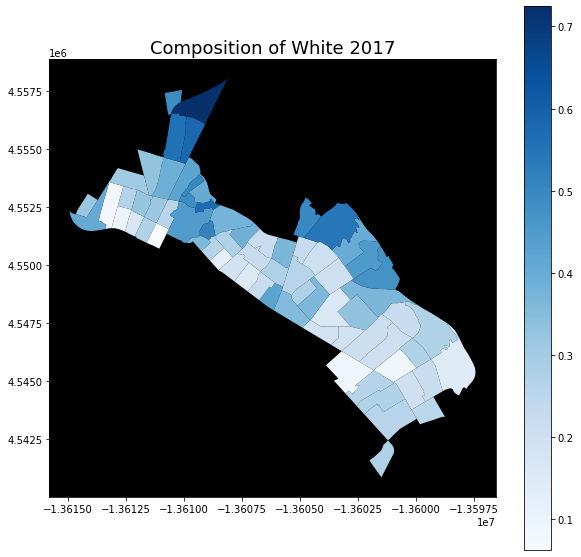

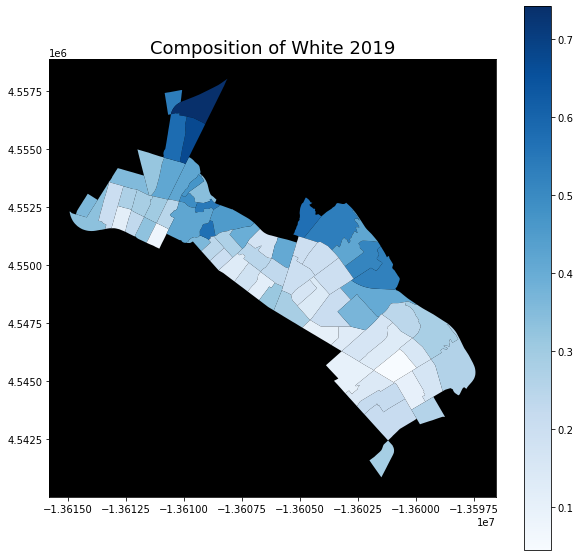

In [9]:
#White composition
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.dropna(subset=['white_com'], axis=0).plot('white_com', ax=ax, cmap='Blues',legend=True)
ax.set_facecolor('k')
ax.set_title('Composition of White 2013', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.dropna(subset=['white_com'], axis=0).plot('white_com', ax=ax, cmap='Blues',legend=True)
ax.set_facecolor('k')
ax.set_title('Composition of White 2015', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.dropna(subset=['white_com'], axis=0).plot('white_com', ax=ax, cmap='Blues',legend=True)
ax.set_facecolor('k')
ax.set_title('Composition of White 2017', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.dropna(subset=['white_com'], axis=0).plot('white_com', ax=ax, cmap='Blues',legend=True)
ax.set_facecolor('k')
ax.set_title('Composition of White 2019', fontsize = 18)

Text(0.5, 1.0, 'Composition of Black 2019')

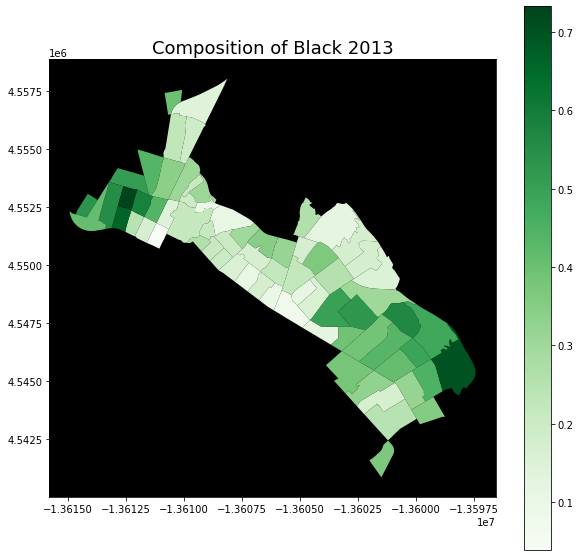

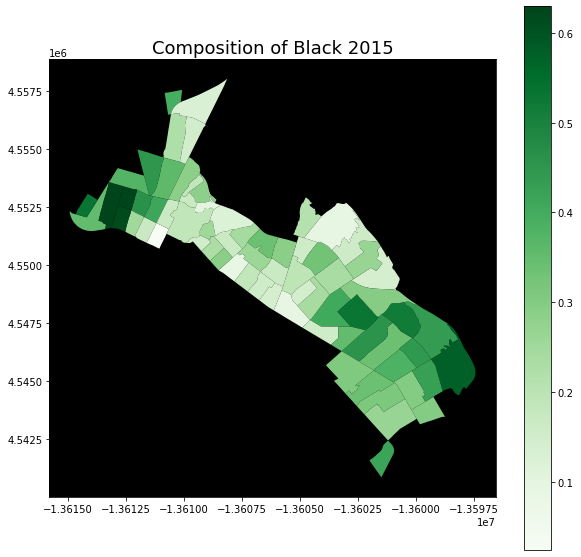

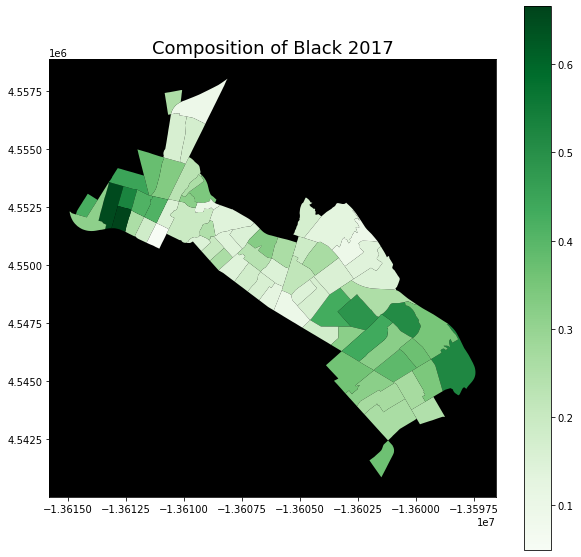

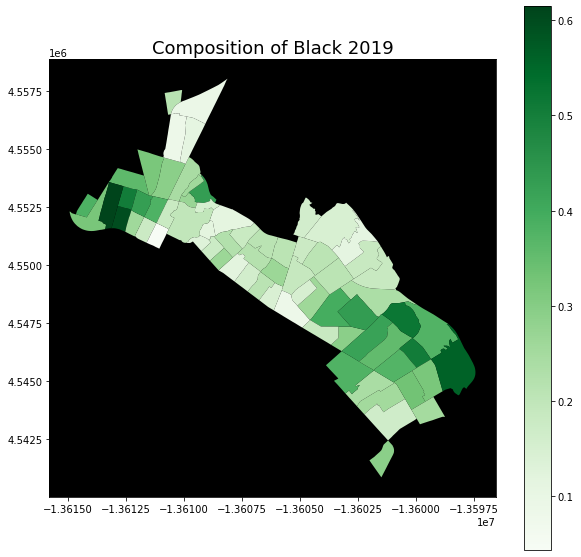

In [10]:
#Black composition
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.dropna(subset=['black_com'], axis=0).plot('black_com', ax=ax, cmap='Greens',legend=True)
ax.set_facecolor('k')
ax.set_title('Composition of Black 2013', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.dropna(subset=['black_com'], axis=0).plot('black_com', ax=ax, cmap='Greens',legend=True)
ax.set_facecolor('k')
ax.set_title('Composition of Black 2015', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.dropna(subset=['black_com'], axis=0).plot('black_com', ax=ax, cmap='Greens',legend=True)
ax.set_facecolor('k')
ax.set_title('Composition of Black 2017', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.dropna(subset=['black_com'], axis=0).plot('black_com', ax=ax, cmap='Greens',legend=True)
ax.set_facecolor('k')
ax.set_title('Composition of Black 2019', fontsize = 18)

Text(0.5, 1.0, 'Composition of Hispanic 2019')

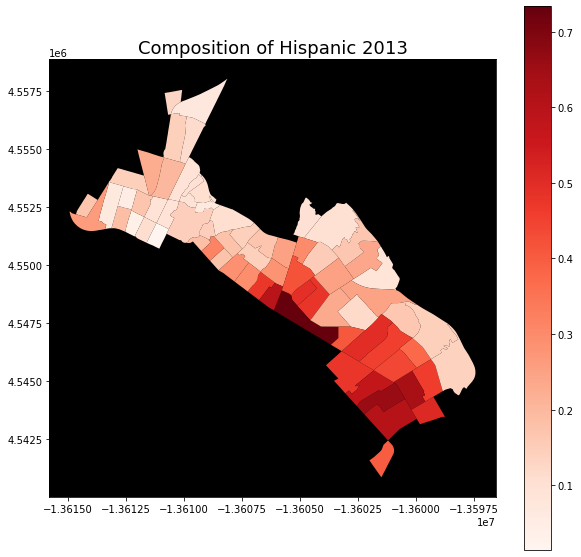

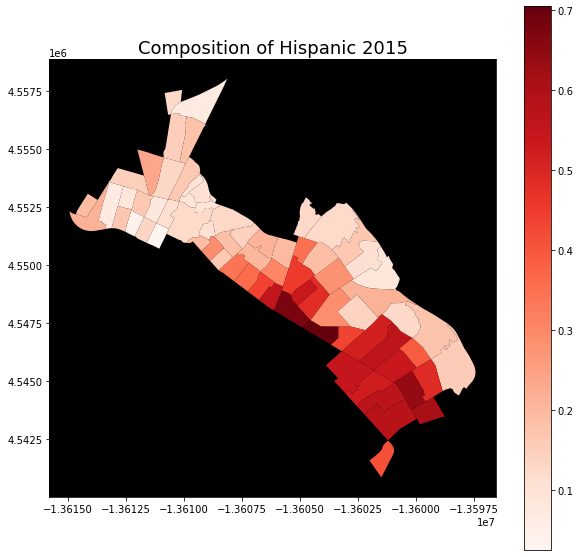

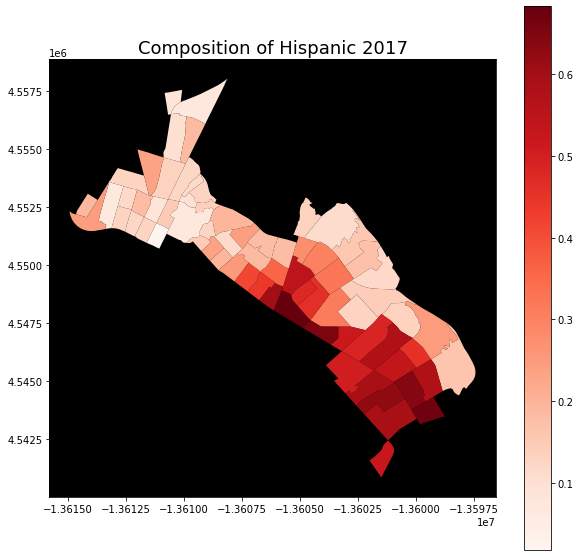

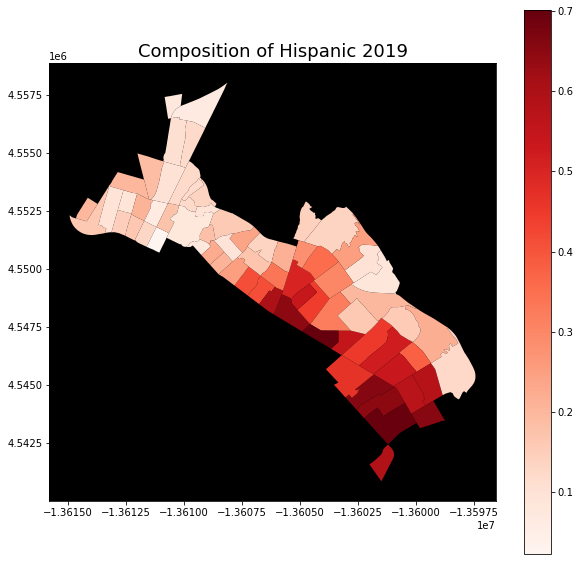

In [11]:
#Hispanic composition
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.dropna(subset=['hisp_com'], axis=0).plot('hisp_com', ax=ax, cmap='Reds',legend=True)
ax.set_facecolor('k')
ax.set_title('Composition of Hispanic 2013', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.dropna(subset=['hisp_com'], axis=0).plot('hisp_com', ax=ax, cmap='Reds',legend=True)
ax.set_facecolor('k')
ax.set_title('Composition of Hispanic 2015', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.dropna(subset=['hisp_com'], axis=0).plot('hisp_com', ax=ax, cmap='Reds',legend=True)
ax.set_facecolor('k')
ax.set_title('Composition of Hispanic 2017', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.dropna(subset=['hisp_com'], axis=0).plot('hisp_com', ax=ax, cmap='Reds',legend=True)
ax.set_facecolor('k')
ax.set_title('Composition of Hispanic 2019', fontsize = 18)

Text(0.5, 1.0, 'Composition of Low Income 2019')

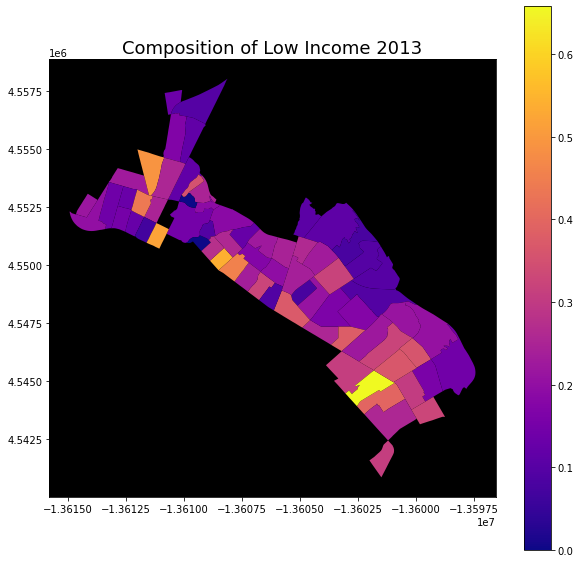

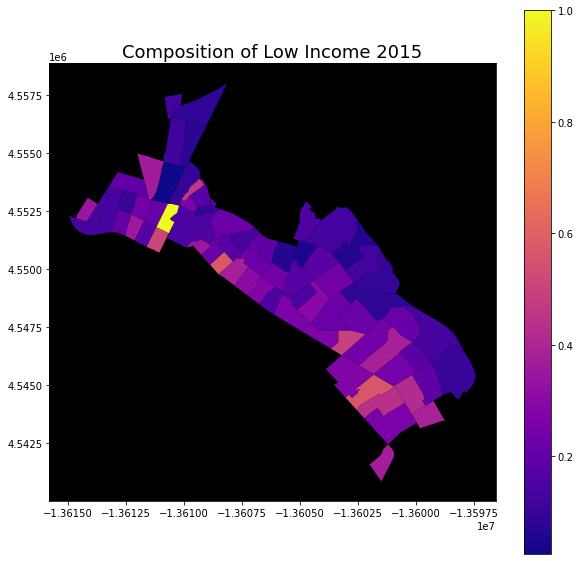

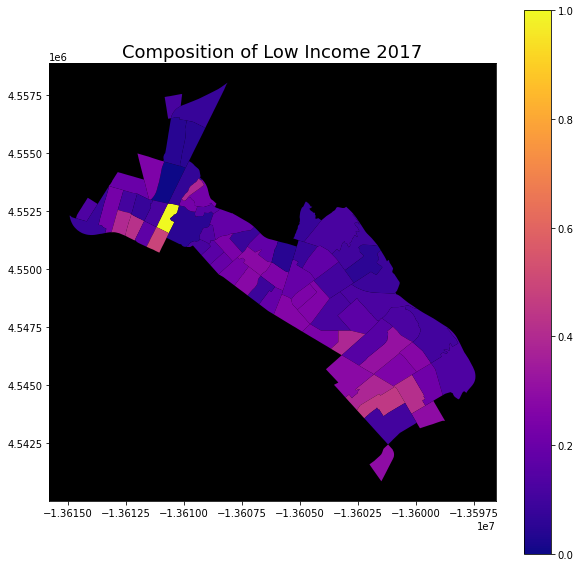

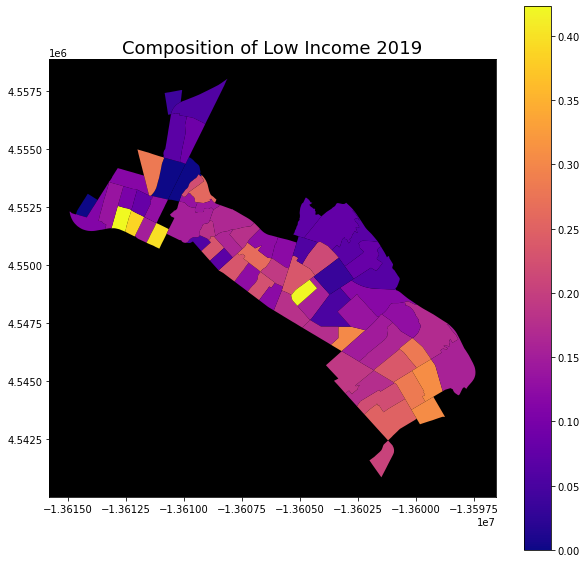

In [29]:
#Low income composition
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.dropna(subset=['low_com'], axis=0).plot('low_com', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Composition of Low Income 2013', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.dropna(subset=['low_com'], axis=0).plot('low_com', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Composition of Low Income 2015', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.dropna(subset=['low_com'], axis=0).plot('low_com', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Composition of Low Income 2017', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.dropna(subset=['low_com'], axis=0).plot('low_com', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Composition of Low Income 2019', fontsize = 18)

Text(0.5, 1.0, 'Composition of Middle Income 2019')

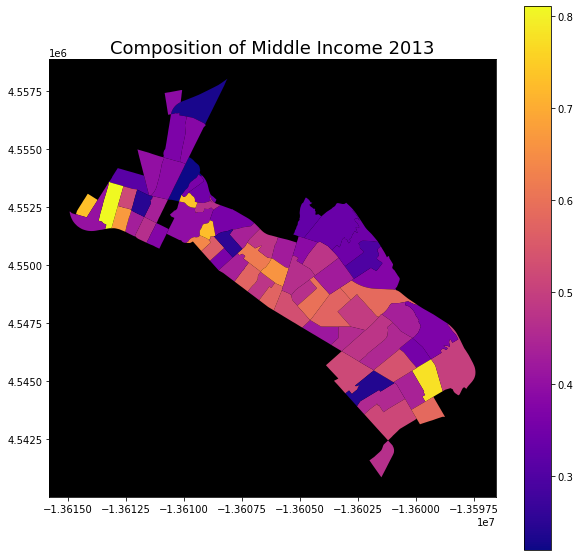

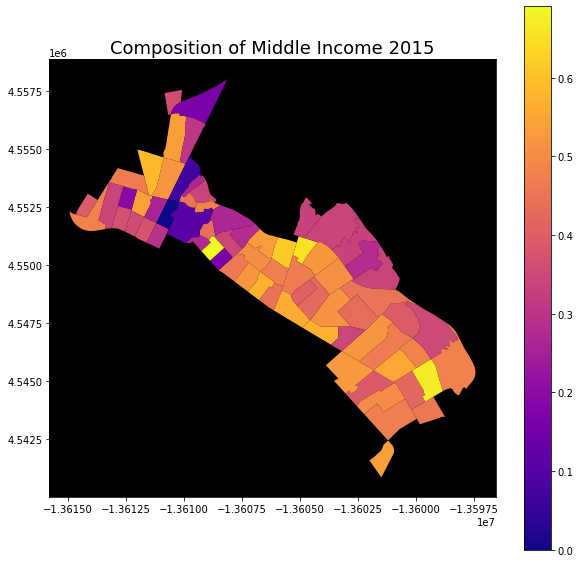

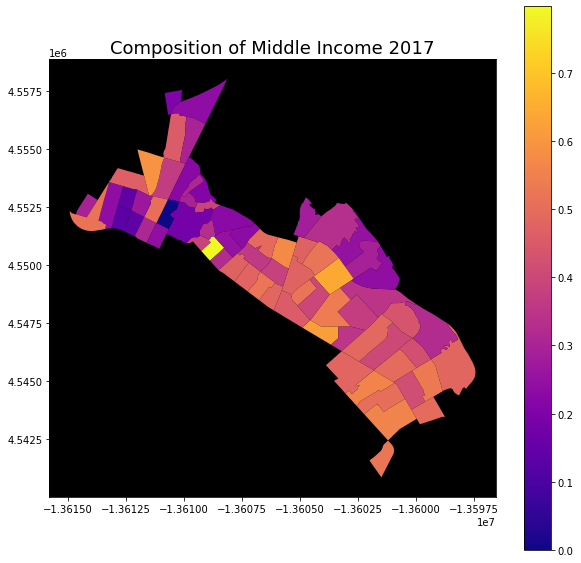

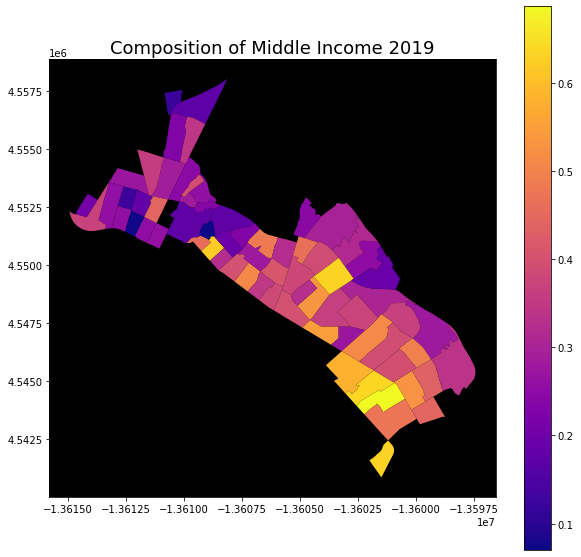

In [30]:
#Middle income composition
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.dropna(subset=['mid_com'], axis=0).plot('mid_com', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Composition of Middle Income 2013', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.dropna(subset=['mid_com'], axis=0).plot('mid_com', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Composition of Middle Income 2015', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.dropna(subset=['mid_com'], axis=0).plot('mid_com', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Composition of Middle Income 2017', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.dropna(subset=['mid_com'], axis=0).plot('mid_com', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Composition of Middle Income 2019', fontsize = 18)

Text(0.5, 1.0, 'Composition of High Income 2019')

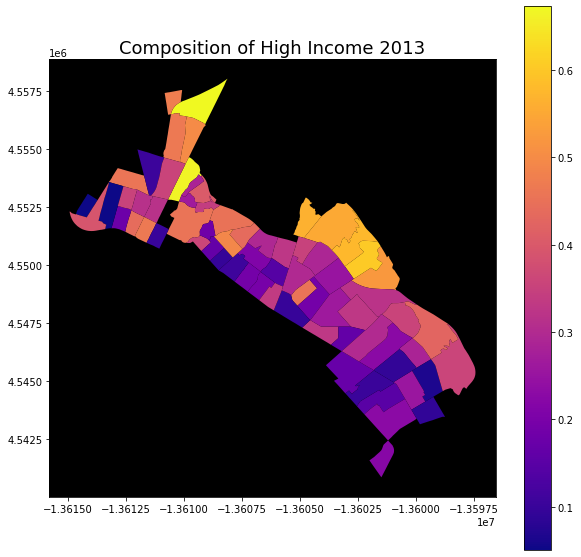

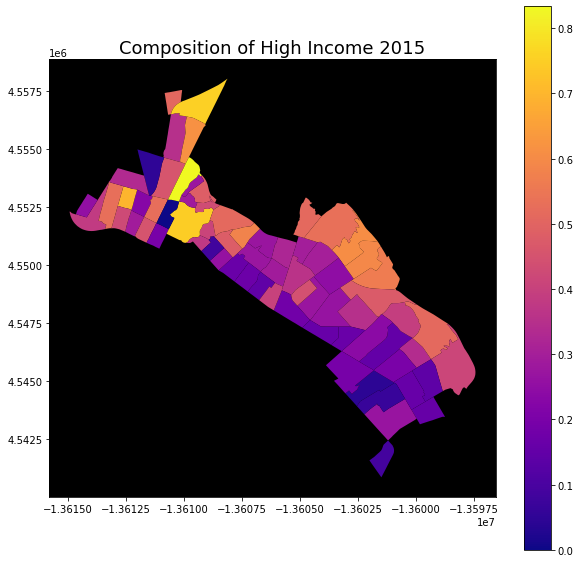

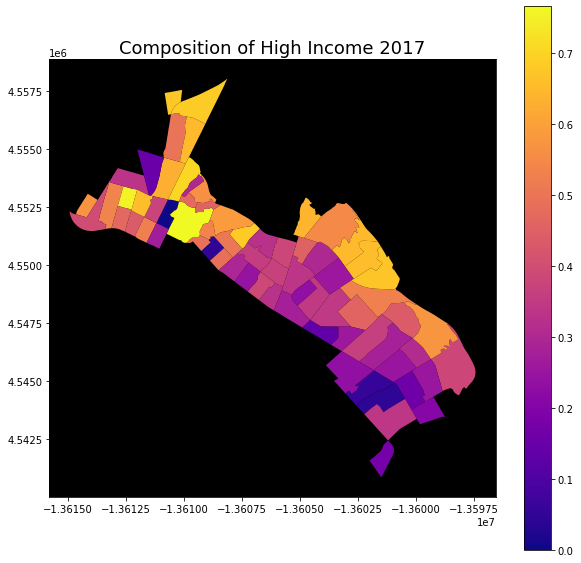

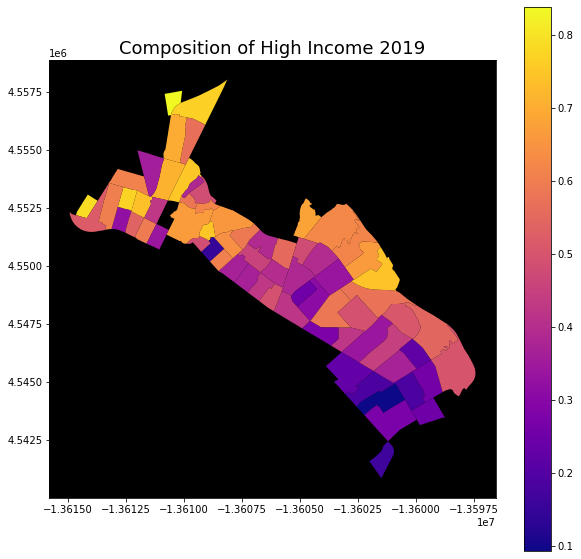

In [31]:
#High income composition
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.dropna(subset=['high_com'], axis=0).plot('high_com', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Composition of High Income 2013', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.dropna(subset=['high_com'], axis=0).plot('high_com', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Composition of High Income 2015', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.dropna(subset=['high_com'], axis=0).plot('high_com', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Composition of High Income 2017', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.dropna(subset=['high_com'], axis=0).plot('high_com', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Composition of High Income 2019', fontsize = 18)

Text(0.5, 1.0, 'Composition of High School or Lower 2019')

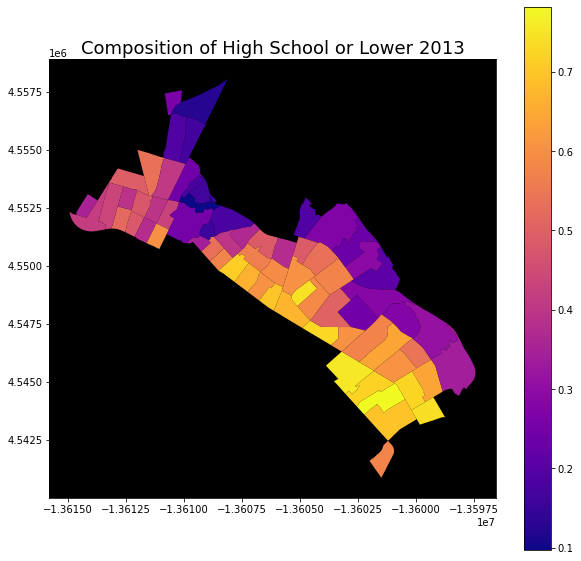

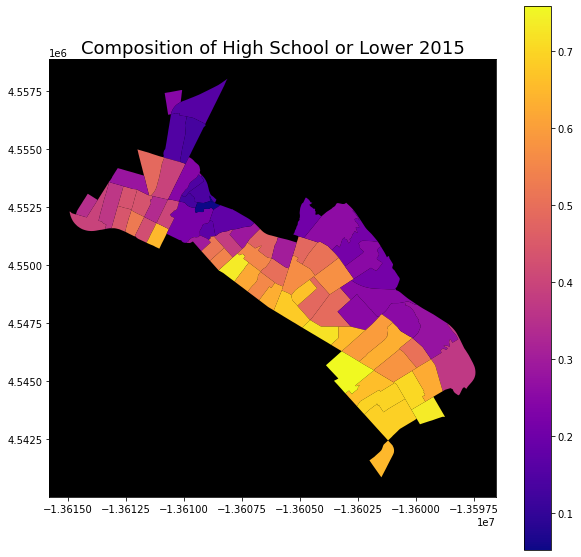

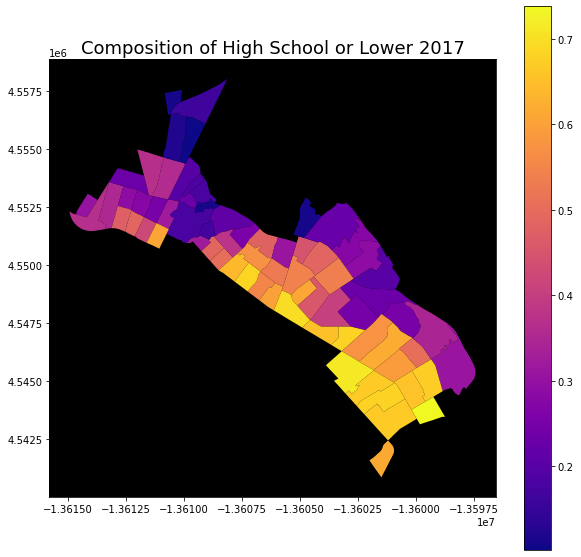

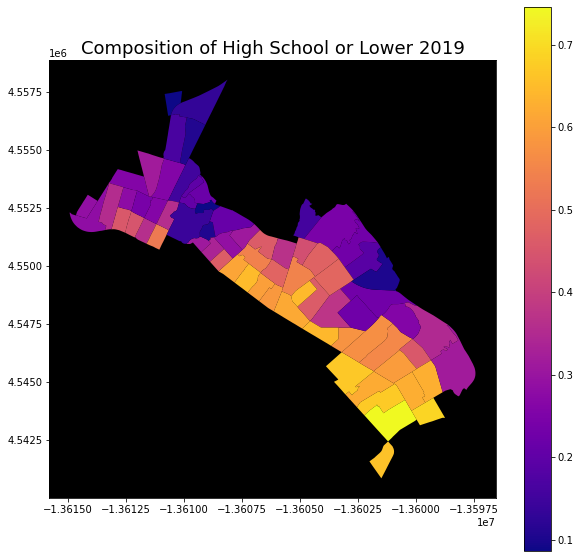

In [32]:
#HS or lower
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.dropna(subset=['HS_com'], axis=0).plot('HS_com', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Composition of High School or Lower 2013', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.dropna(subset=['HS_com'], axis=0).plot('HS_com', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Composition of High School or Lower 2015', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.dropna(subset=['HS_com'], axis=0).plot('HS_com', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Composition of High School or Lower 2017', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.dropna(subset=['HS_com'], axis=0).plot('HS_com', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Composition of High School or Lower 2019', fontsize = 18)

Text(0.5, 1.0, 'Composition of Bachelor or Greater 2019')

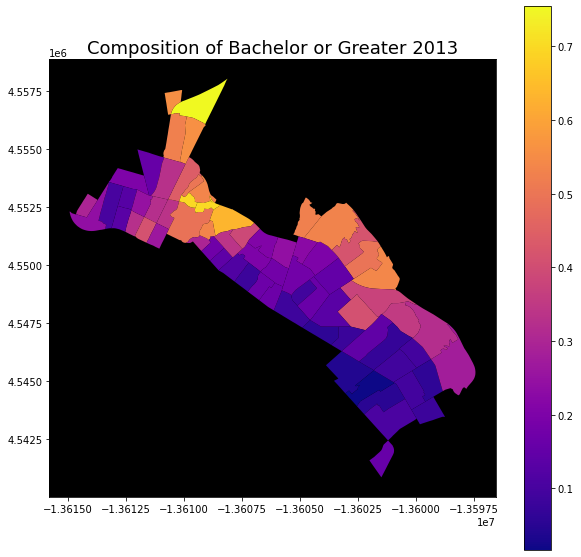

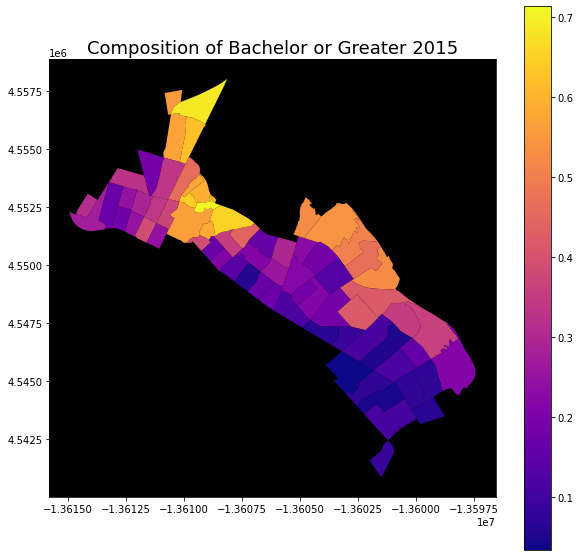

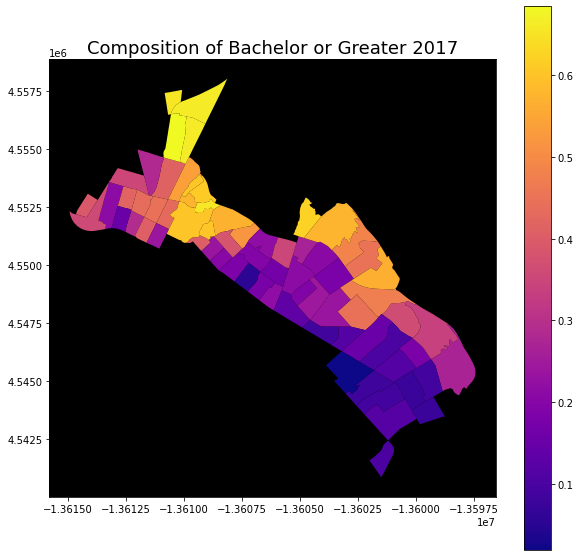

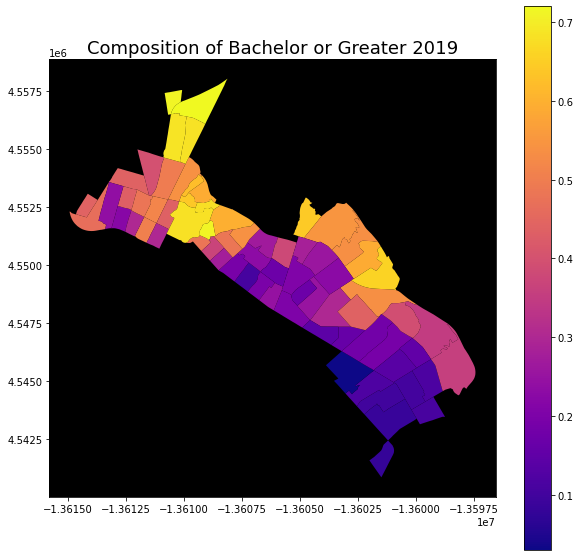

In [33]:
#BD or greater
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.dropna(subset=['BD_com'], axis=0).plot('BD_com', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Composition of Bachelor or Greater 2013', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.dropna(subset=['BD_com'], axis=0).plot('BD_com', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Composition of Bachelor or Greater 2015', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.dropna(subset=['BD_com'], axis=0).plot('BD_com', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Composition of Bachelor or Greater 2017', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.dropna(subset=['BD_com'], axis=0).plot('BD_com', ax=ax, cmap='plasma',legend=True)
ax.set_facecolor('k')
ax.set_title('Composition of Bachelor or Greater 2019', fontsize = 18)

In [34]:
race= ['B02001_002E','B02001_003E','B03001_003E']
income = ['low_in','mid_in','B25121_092E']
edu=['HS_max','BD_min']
#LQ statistics 
#race
LQ13r = MultiLocationQuotient(oakland13, race)
LQ13r.statistics

LQ15r = MultiLocationQuotient(oakland15, race)
LQ15r.statistics

LQ17r = MultiLocationQuotient(oakland17, race)
LQ17r.statistics

LQ19r = MultiLocationQuotient(oakland19, race)
LQ19r.statistics

#income
LQ13i = MultiLocationQuotient(oakland13, income)
LQ13i.statistics

LQ15i = MultiLocationQuotient(oakland15, income)
LQ15i.statistics

LQ17i = MultiLocationQuotient(oakland17, income)
LQ17i.statistics

LQ19i = MultiLocationQuotient(oakland19, income)
LQ19i.statistics

#education
LQ13e = MultiLocationQuotient(oakland13, edu)
LQ13e.statistics

LQ15e = MultiLocationQuotient(oakland15, edu)
LQ15e.statistics

LQ17e = MultiLocationQuotient(oakland17, edu)
LQ17e.statistics

LQ19e = MultiLocationQuotient(oakland19, edu)
LQ19e.statistics

array([[0.79844298, 1.2194065 ],
       [0.20711592, 1.86310026],
       [0.75527309, 1.26639942],
       [1.65075376, 0.29161683],
       [1.44794497, 0.51238595],
       [1.3896321 , 0.57586288],
       [0.46181479, 1.58584578],
       [0.24938765, 1.81708504],
       [0.37530412, 1.68001766],
       [0.59026428, 1.44602107],
       [1.50167775, 0.4538947 ],
       [0.57333452, 1.4644501 ],
       [0.75974547, 1.26153098],
       [1.29367187, 0.68032115],
       [0.75194966, 1.27001717],
       [1.14862974, 0.83820792],
       [0.71616962, 1.30896581],
       [0.65833004, 1.37192755],
       [0.46572422, 1.58159014],
       [0.29692679, 1.76533593],
       [1.34750643, 0.62171911],
       [1.44106137, 0.51987914],
       [1.24322916, 0.73523096],
       [1.67398693, 0.26632618],
       [0.57330777, 1.46447921],
       [0.42188213, 1.6293148 ],
       [0.91217406, 1.09560363],
       [1.45845458, 0.50094563],
       [1.21567689, 0.76522321],
       [0.94691823, 1.05778258],
       [1.

<ipython-input-36-ddecd90bfbf6>:73: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, ax = plt.subplots(1,1,figsize=(10,10))


Text(0.5, 1.0, 'Location Quotient of Bachelor or Greater 2019')

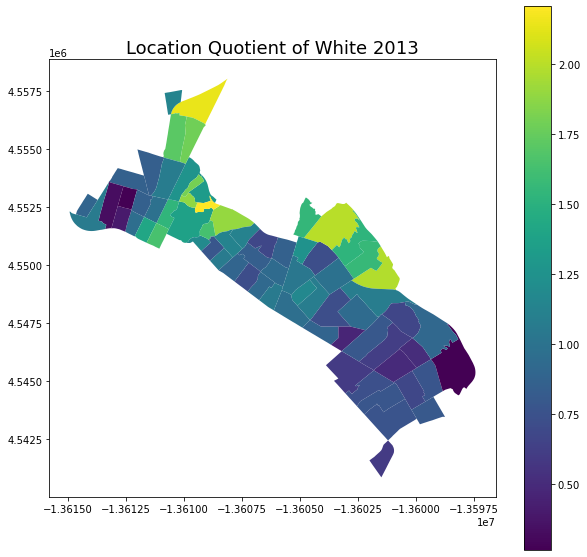

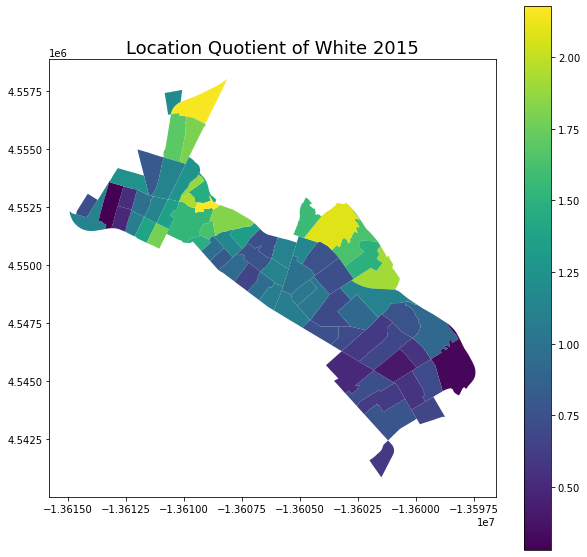

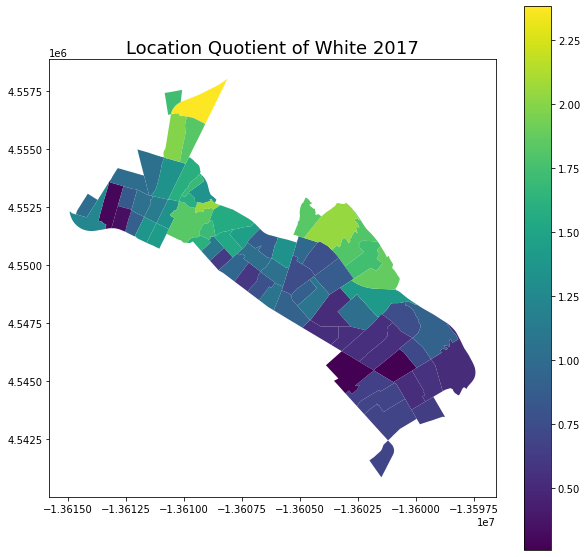

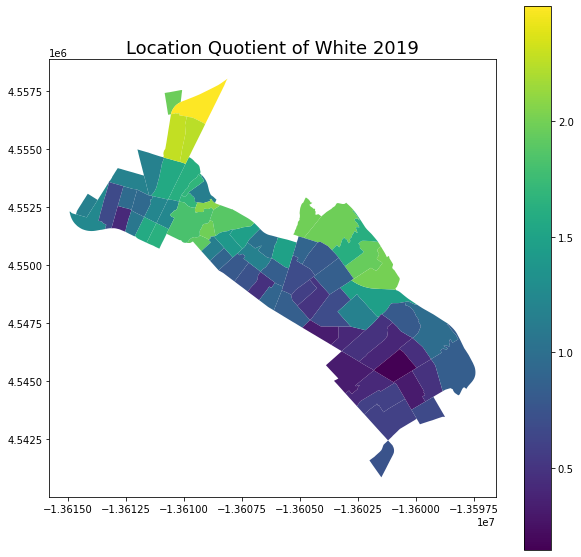

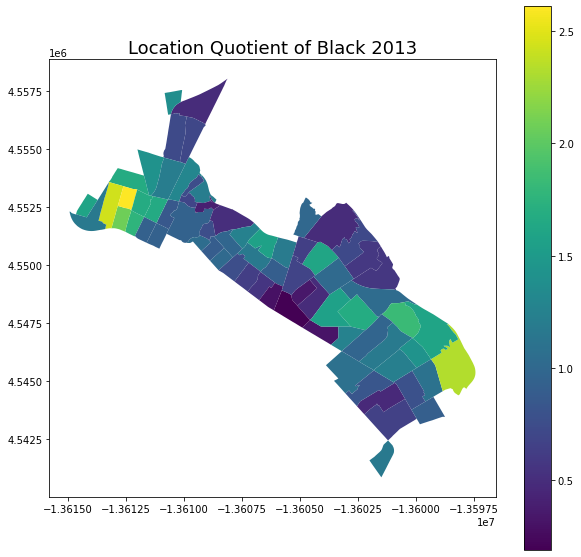

...

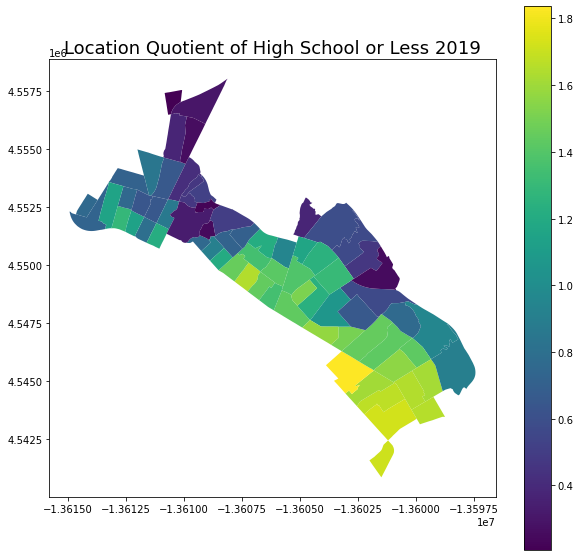

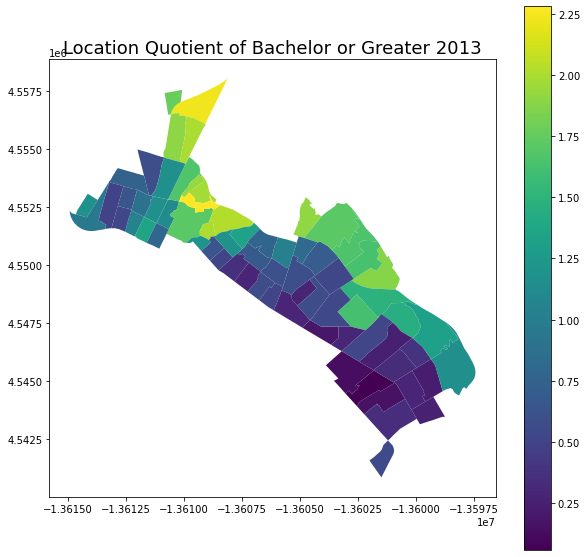

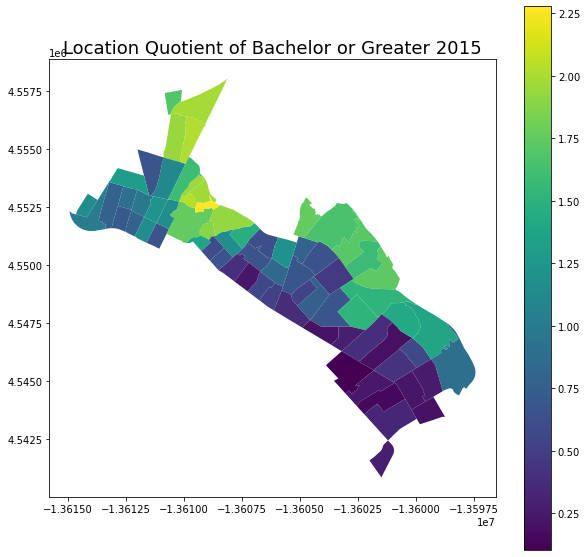

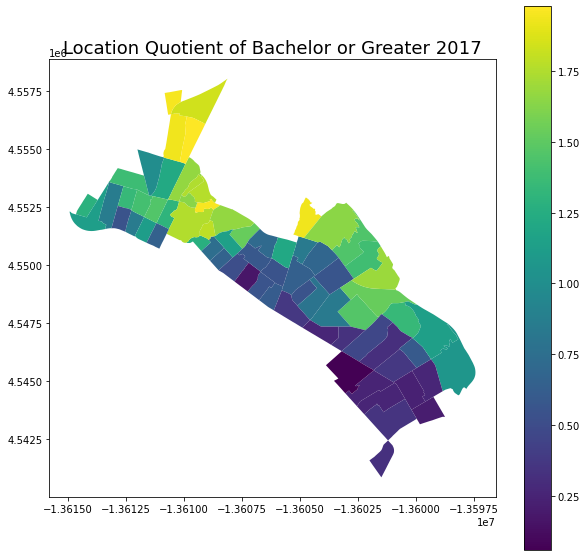

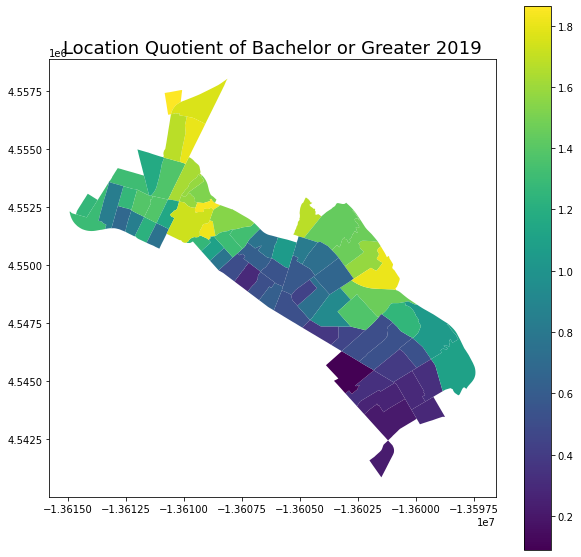

In [36]:
#LQ 
#White
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.plot(LQ13r.statistics[:,0],cmap = 'viridis',legend = True, ax = ax)
ax.set_title('Location Quotient of White 2013', fontsize = 18)
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.plot(LQ15r.statistics[:,0],cmap = 'viridis',legend = True, ax = ax)
ax.set_title('Location Quotient of White 2015', fontsize = 18)
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.plot(LQ17r.statistics[:,0],cmap = 'viridis',legend = True, ax = ax)
ax.set_title('Location Quotient of White 2017', fontsize = 18)
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.plot(LQ19r.statistics[:,0],cmap = 'viridis',legend = True, ax = ax)
ax.set_title('Location Quotient of White 2019', fontsize = 18)

#Black
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.plot(LQ13r.statistics[:,1],cmap = 'viridis',legend = True, ax = ax)
ax.set_title('Location Quotient of Black 2013', fontsize = 18)
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.plot(LQ15r.statistics[:,1],cmap = 'viridis',legend = True, ax = ax)
ax.set_title('Location Quotient of Black 2015', fontsize = 18)
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.plot(LQ17r.statistics[:,1],cmap = 'viridis',legend = True, ax = ax)
ax.set_title('Location Quotient of Black 2017', fontsize = 18)
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.plot(LQ19r.statistics[:,1],cmap = 'viridis',legend = True, ax = ax)
ax.set_title('Location Quotient of Black 2019', fontsize = 18)

#Hispanic
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.plot(LQ13r.statistics[:,2],cmap = 'viridis',legend = True, ax = ax)
ax.set_title('Location Quotient of Hispanic 2013', fontsize = 18)
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.plot(LQ15r.statistics[:,2],cmap = 'viridis',legend = True, ax = ax)
ax.set_title('Location Quotient of Hispanic 2015', fontsize = 18)
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.plot(LQ17r.statistics[:,2],cmap = 'viridis',legend = True, ax = ax)
ax.set_title('Location Quotient of Hispanic 2017', fontsize = 18)
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.plot(LQ19r.statistics[:,2],cmap = 'viridis',legend = True, ax = ax)
ax.set_title('Location Quotient of Hispanic 2019', fontsize = 18)

#Low income
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.plot(LQ13i.statistics[:,0],cmap = 'viridis',legend = True, ax = ax)
ax.set_title('Location Quotient of Low Income 2013', fontsize = 18)
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.plot(LQ15i.statistics[:,0],cmap = 'viridis',legend = True, ax = ax)
ax.set_title('Location Quotient of Low Income 2015', fontsize = 18)
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.plot(LQ17i.statistics[:,0],cmap = 'viridis',legend = True, ax = ax)
ax.set_title('Location Quotient of Low Income 2017', fontsize = 18)
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.plot(LQ19i.statistics[:,0],cmap = 'viridis',legend = True, ax = ax)
ax.set_title('Location Quotient of Low Income 2019', fontsize = 18)

#Middle income
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.plot(LQ13i.statistics[:,1],cmap = 'viridis',legend = True, ax = ax)
ax.set_title('Location Quotient of Middle Income 2013', fontsize = 18)
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.plot(LQ15i.statistics[:,1],cmap = 'viridis',legend = True, ax = ax)
ax.set_title('Location Quotient of Middle Income 2015', fontsize = 18)
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.plot(LQ17i.statistics[:,1],cmap = 'viridis',legend = True, ax = ax)
ax.set_title('Location Quotient of Middle Income 2017', fontsize = 18)
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.plot(LQ19i.statistics[:,1],cmap = 'viridis',legend = True, ax = ax)
ax.set_title('Location Quotient of Middle Income 2019', fontsize = 18)

#High income
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.plot(LQ13i.statistics[:,2],cmap = 'viridis',legend = True, ax = ax)
ax.set_title('Location Quotient of High Income 2013', fontsize = 18)
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.plot(LQ15i.statistics[:,2],cmap = 'viridis',legend = True, ax = ax)
ax.set_title('Location Quotient of High Income 2015', fontsize = 18)
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.plot(LQ17i.statistics[:,2],cmap = 'viridis',legend = True, ax = ax)
ax.set_title('Location Quotient of High Income 2017', fontsize = 18)
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.plot(LQ19i.statistics[:,2],cmap = 'viridis',legend = True, ax = ax)
ax.set_title('Location Quotient of High Income 2019', fontsize = 18)

#Highschool or less
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.plot(LQ13e.statistics[:,0],cmap = 'viridis',legend = True, ax = ax)
ax.set_title('Location Quotient of High School or Less 2013', fontsize = 18)
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.plot(LQ15e.statistics[:,0],cmap = 'viridis',legend = True, ax = ax)
ax.set_title('Location Quotient of High School or Less 2015', fontsize = 18)
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.plot(LQ17e.statistics[:,0],cmap = 'viridis',legend = True, ax = ax)
ax.set_title('Location Quotient of High School or Less 2017', fontsize = 18)
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.plot(LQ19e.statistics[:,0],cmap = 'viridis',legend = True, ax = ax)
ax.set_title('Location Quotient of High School or Less 2019', fontsize = 18)

#BD or greater
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.plot(LQ13e.statistics[:,1],cmap = 'viridis',legend = True, ax = ax)
ax.set_title('Location Quotient of Bachelor or Greater 2013', fontsize = 18)
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.plot(LQ15e.statistics[:,1],cmap = 'viridis',legend = True, ax = ax)
ax.set_title('Location Quotient of Bachelor or Greater 2015', fontsize = 18)
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.plot(LQ17e.statistics[:,1],cmap = 'viridis',legend = True, ax = ax)
ax.set_title('Location Quotient of Bachelor or Greater 2017', fontsize = 18)
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.plot(LQ19e.statistics[:,1],cmap = 'viridis',legend = True, ax = ax)
ax.set_title('Location Quotient of Bachelor or Greater 2019', fontsize = 18)

In [37]:
#Local Diversity
#race
LD13r = MultiLocalDiversity(oakland19, race)
LD13r.statistics

LD15r = MultiLocalDiversity(oakland19, race)
LD15r.statistics

LD17r = MultiLocalDiversity(oakland19, race)
LD17r.statistics

LD19r = MultiLocalDiversity(oakland19, race)
LD19r.statistics
#income
LD13i = MultiLocalDiversity(oakland19, income)
LD13i.statistics

LD15i = MultiLocalDiversity(oakland19, income)
LD15i.statistics

LD17i = MultiLocalDiversity(oakland19, income)
LD17i.statistics

LD19i = MultiLocalDiversity(oakland19, income)
LD19i.statistics

#Education
LD13e = MultiLocalDiversity(oakland19, edu)
LD13e.statistics

LD15e = MultiLocalDiversity(oakland19, edu)
LD15e.statistics

LD17e = MultiLocalDiversity(oakland19, edu)
LD17e.statistics

LD19e = MultiLocalDiversity(oakland19, edu)
LD19e.statistics

array([0.67901856, 0.34220556, 0.67035233, 0.40428385, 0.55714624,
       0.58886808, 0.5518834 , 0.38635063, 0.49425431, 0.61720436,
       0.52350069, 0.6098632 , 0.67134795, 0.63111865, 0.66959774,
       0.67354858, 0.66067215, 0.64308466, 0.55421297, 0.43087508,
       0.60888458, 0.56114304, 0.64869305, 0.38163879, 0.60985131,
       0.52676272, 0.69193891, 0.55090973, 0.65700546, 0.69306357,
       0.68702254, 0.44332065, 0.69314534, 0.66294896, 0.6374362 ,
       0.68656157, 0.63910665, 0.40028037, 0.65590942, 0.64813175,
       0.17676071, 0.55391294, 0.56663631, 0.32825574, 0.40905425,
       0.56459364, 0.65494428, 0.66033835, 0.6255026 , 0.34076822,
       0.3943771 , 0.48029971, 0.67271213, 0.43775485, 0.58386159,
       0.35603975, 0.57628852, 0.51447419, 0.67046796, 0.64168678,
       0.39798052, 0.67341707, 0.68827334, 0.49261701, 0.55334992,
       0.45777017, 0.6608117 , 0.60812286, 0.57441094, 0.47426365,
       0.69132563])

Text(0.5, 1.0, 'Local Diversity (Education) 2019')

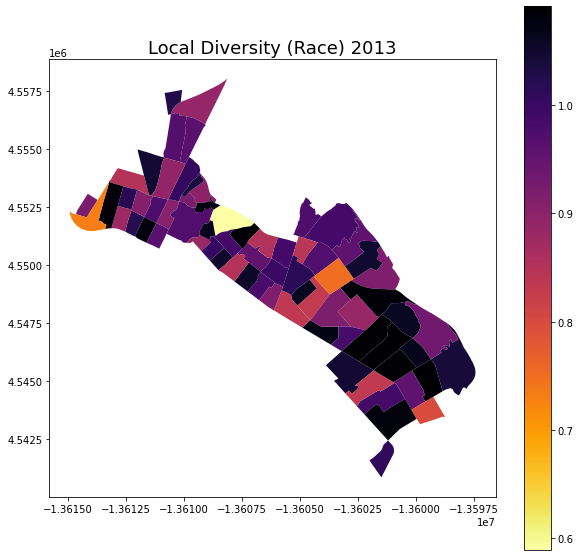

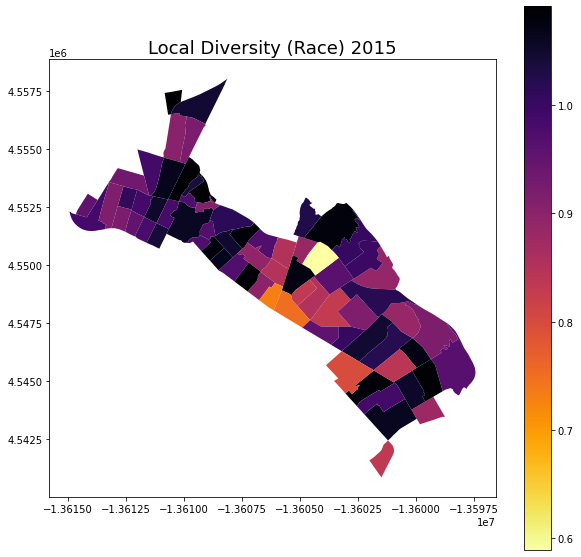

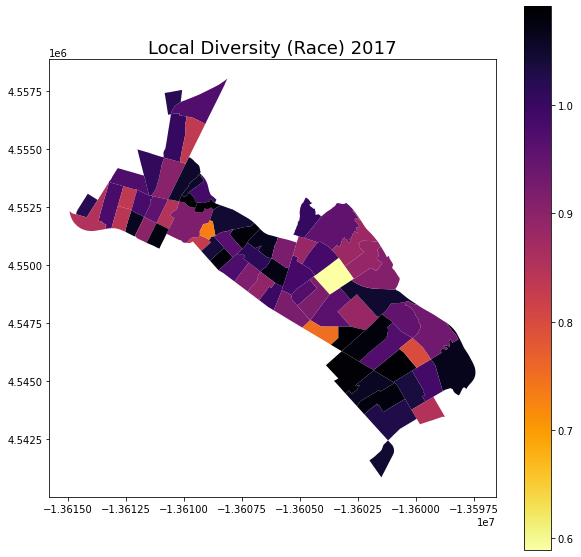

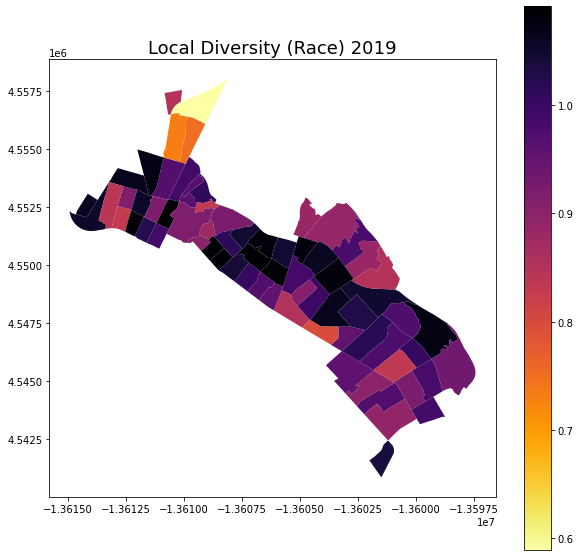

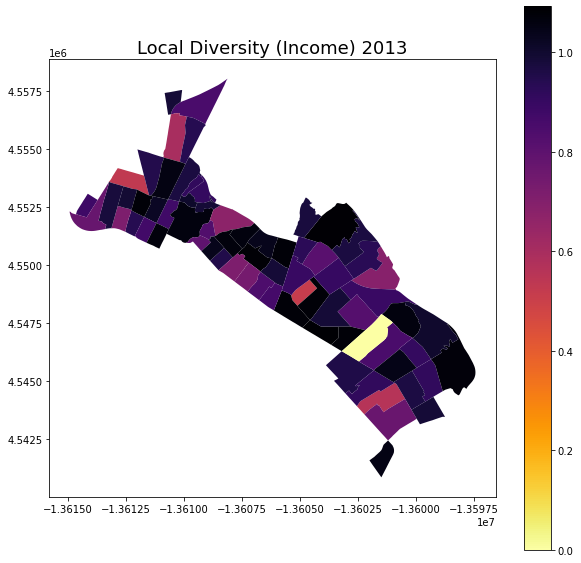

...

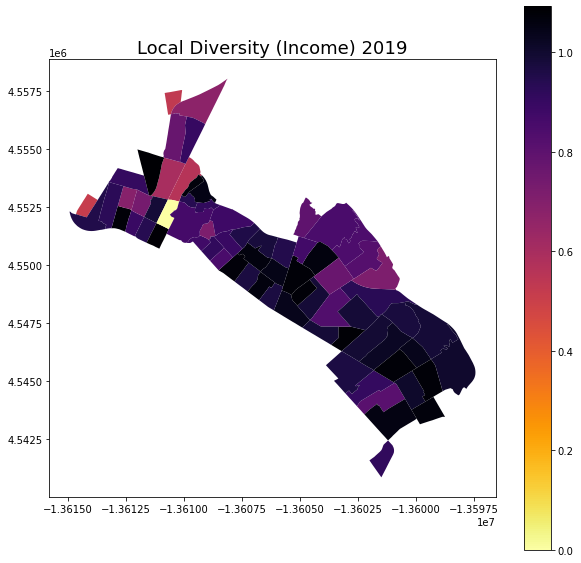

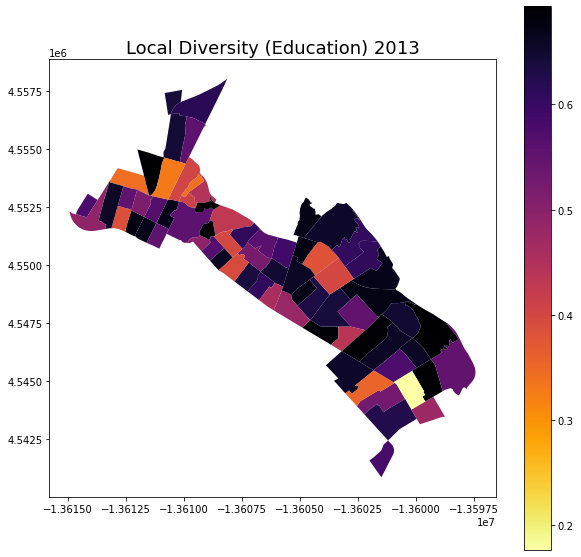

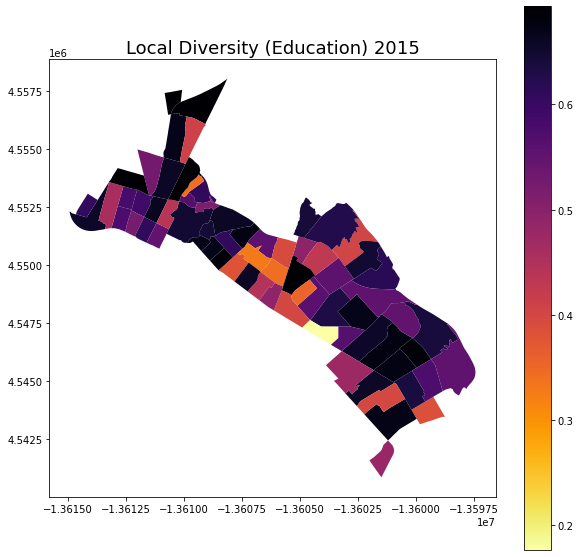

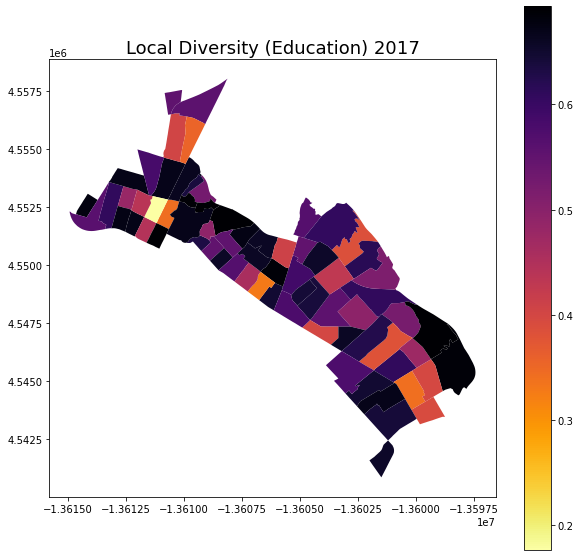

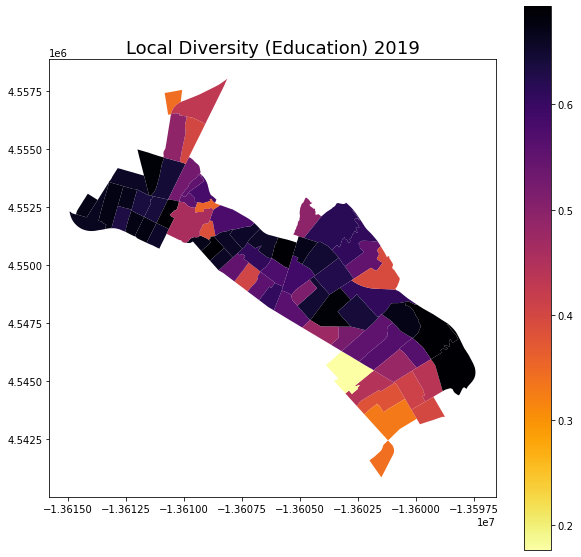

In [23]:
#Race
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.plot(LD13r.statistics,cmap = 'inferno_r',legend = True, ax = ax)
ax.set_title('Local Diversity (Race) 2013', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.plot(LD15r.statistics,cmap = 'inferno_r',legend = True, ax = ax)
ax.set_title('Local Diversity (Race) 2015', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.plot(LD17r.statistics,cmap = 'inferno_r',legend = True, ax = ax)
ax.set_title('Local Diversity (Race) 2017', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.plot(LD19r.statistics,cmap = 'inferno_r',legend = True, ax = ax)
ax.set_title('Local Diversity (Race) 2019', fontsize = 18)

#Income
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.plot(LD13i.statistics,cmap = 'inferno_r',legend = True, ax = ax)
ax.set_title('Local Diversity (Income) 2013', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.plot(LD15i.statistics,cmap = 'inferno_r',legend = True, ax = ax)
ax.set_title('Local Diversity (Income) 2015', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.plot(LD17i.statistics,cmap = 'inferno_r',legend = True, ax = ax)
ax.set_title('Local Diversity (Income) 2017', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.plot(LD19i.statistics,cmap = 'inferno_r',legend = True, ax = ax)
ax.set_title('Local Diversity (Income) 2019', fontsize = 18)
#Education
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.plot(LD13e.statistics,cmap = 'inferno_r',legend = True, ax = ax)
ax.set_title('Local Diversity (Education) 2013', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.plot(LD15e.statistics,cmap = 'inferno_r',legend = True, ax = ax)
ax.set_title('Local Diversity (Education) 2015', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.plot(LD17e.statistics,cmap = 'inferno_r',legend = True, ax = ax)
ax.set_title('Local Diversity (Education) 2017', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.plot(LD19e.statistics,cmap = 'inferno_r',legend = True, ax = ax)
ax.set_title('Local Diversity (Education) 2019', fontsize = 18)

In [41]:
#Local Entrophy
#race
LE13r = MultiLocalEntropy(oakland13, race)
LE13r.statistics

LE15r = MultiLocalEntropy(oakland15, race)
LE15r.statistics

LE17r = MultiLocalEntropy(oakland17, race)
LE17r.statistics

LE19r = MultiLocalEntropy(oakland19, race)
LE19r.statistics
#Income
LE13i = MultiLocalEntropy(oakland13, income)
LE13i.statistics

LE15i = MultiLocalEntropy(oakland15, income)
LE15i.statistics

LE17i = MultiLocalEntropy(oakland17, income)
LE17i.statistics

LE19i = MultiLocalEntropy(oakland19, income)
LE19i.statistics
#Education
LE13e = MultiLocalEntropy(oakland13, edu)
LE13e.statistics

LE15e = MultiLocalEntropy(oakland15, edu)
LE15e.statistics

LE17e = MultiLocalEntropy(oakland17, edu)
LE17e.statistics

LE19e = MultiLocalEntropy(oakland19, edu)
LE19e.statistics

array([0.97961671, 0.49369826, 0.96711398, 0.5832583 , 0.80379211,
       0.84955705, 0.79619945, 0.55738614, 0.71305824, 0.89043766,
       0.75525185, 0.87984661, 0.96855036, 0.91051174, 0.96602534,
       0.9717252 , 0.95314844, 0.92777505, 0.79956031, 0.62162135,
       0.87843476, 0.80955829, 0.93586624, 0.5505884 , 0.87982946,
       0.75995797, 0.99825683, 0.79479474, 0.94785852, 0.99987938,
       0.99116401, 0.63957651, 0.99999735, 0.95643318, 0.91962605,
       0.99049897, 0.92203599, 0.5774825 , 0.94627727, 0.93505646,
       0.25501179, 0.79912746, 0.8174834 , 0.47357292, 0.59014054,
       0.81453645, 0.94488486, 0.95266686, 0.90240949, 0.49162462,
       0.56896589, 0.692926  , 0.97051845, 0.63154675, 0.84233422,
       0.51365679, 0.83140859, 0.74222936, 0.96728081, 0.92575833,
       0.57416452, 0.97153546, 0.99296854, 0.71069612, 0.79831518,
       0.66042276, 0.95334977, 0.87733583, 0.82869981, 0.68421782,
       0.99737206])

Text(0.5, 1.0, 'Local Entropy (Education) 2019')

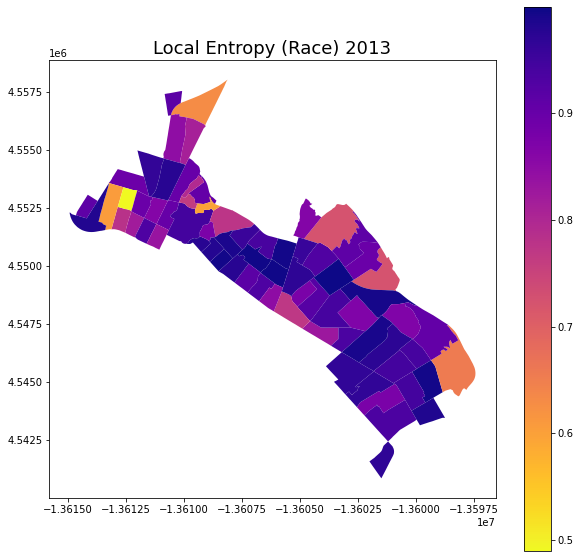

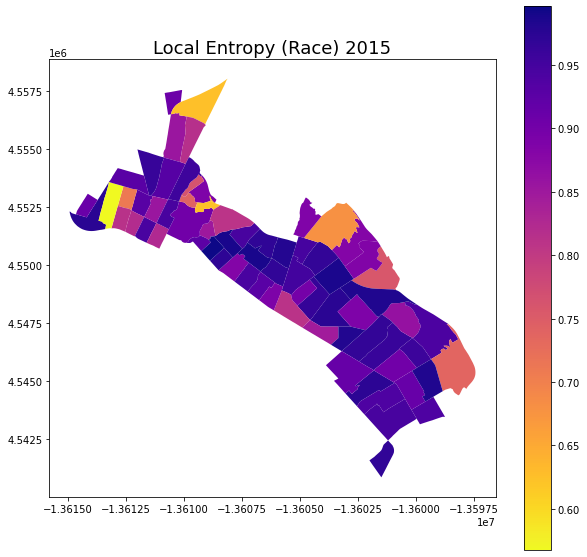

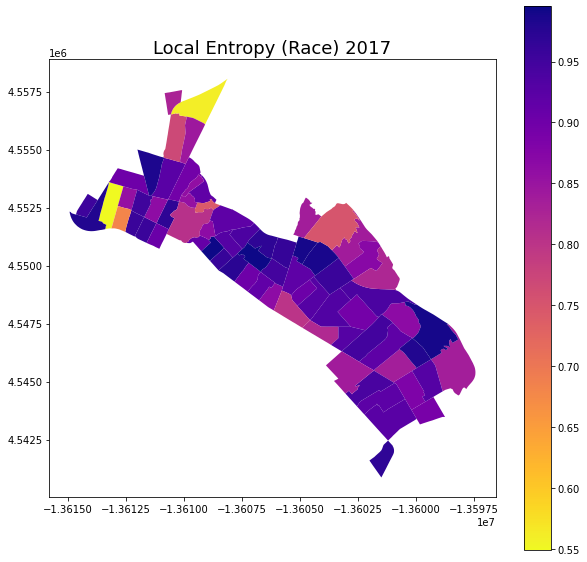

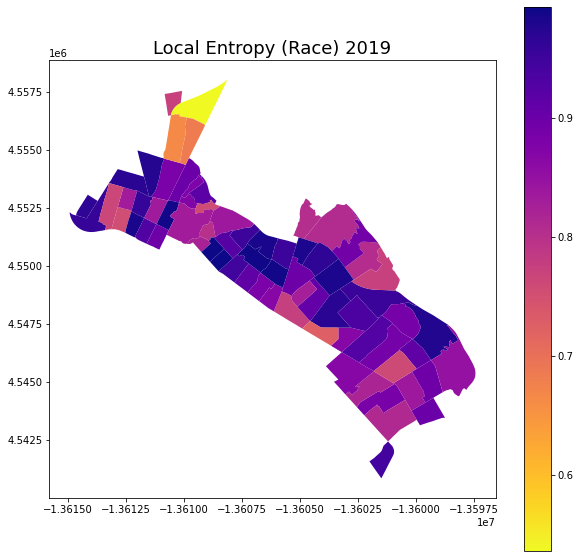

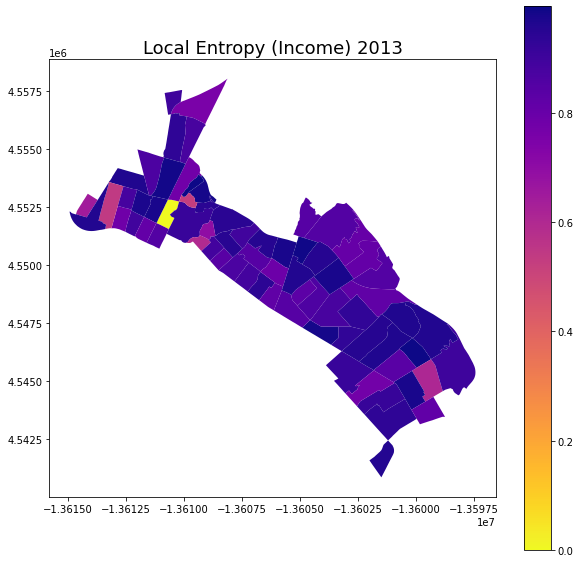

...

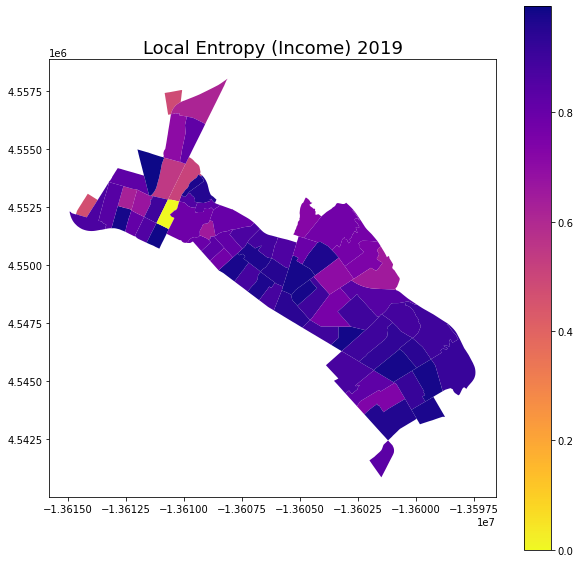

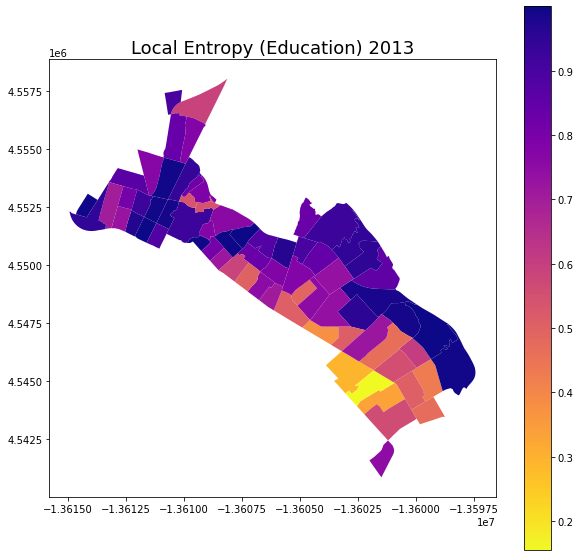

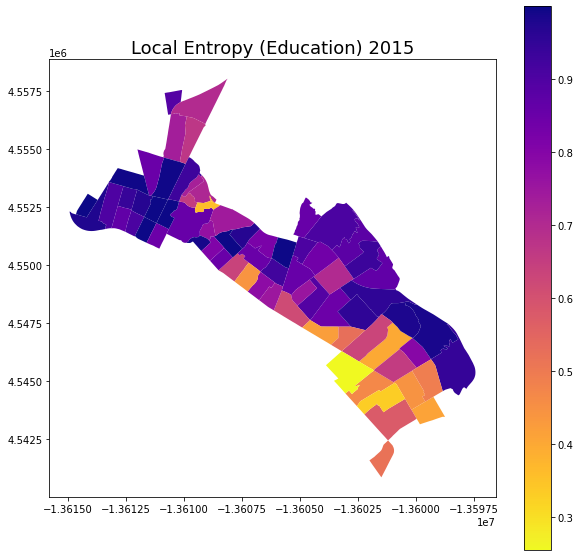

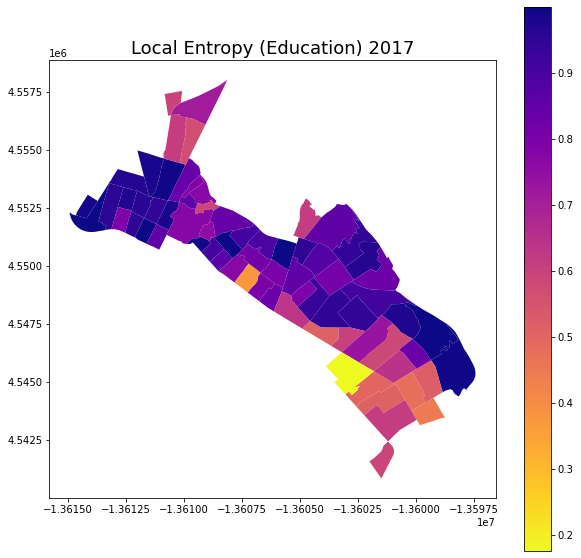

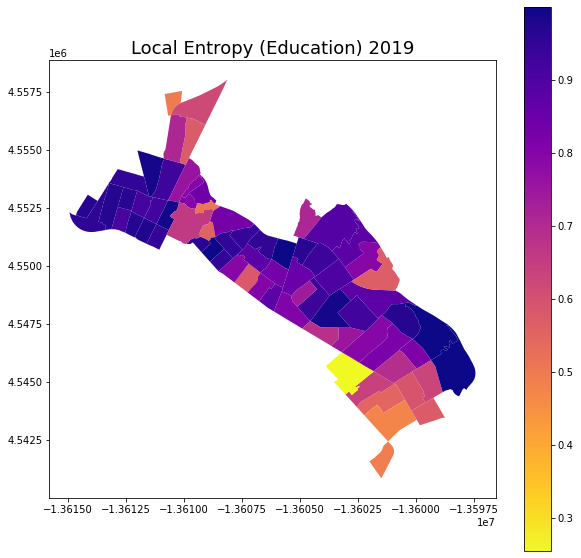

In [43]:
# Race
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.plot(LE13r.statistics,cmap = 'plasma_r',legend = True, ax = ax)
ax.set_title('Local Entropy (Race) 2013', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.plot(LE15r.statistics,cmap = 'plasma_r',legend = True, ax = ax)
ax.set_title('Local Entropy (Race) 2015', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.plot(LE17r.statistics,cmap = 'plasma_r',legend = True, ax = ax)
ax.set_title('Local Entropy (Race) 2017', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.plot(LE19r.statistics,cmap = 'plasma_r',legend = True, ax = ax)
ax.set_title('Local Entropy (Race) 2019', fontsize = 18)

# Income
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.plot(LE13i.statistics,cmap = 'plasma_r',legend = True, ax = ax)
ax.set_title('Local Entropy (Income) 2013', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.plot(LE15i.statistics,cmap = 'plasma_r',legend = True, ax = ax)
ax.set_title('Local Entropy (Income) 2015', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.plot(LE17i.statistics,cmap = 'plasma_r',legend = True, ax = ax)
ax.set_title('Local Entropy (Income) 2017', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.plot(LE19i.statistics,cmap = 'plasma_r',legend = True, ax = ax)
ax.set_title('Local Entropy (Income) 2019', fontsize = 18)

# Education
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.plot(LE13e.statistics,cmap = 'plasma_r',legend = True, ax = ax)
ax.set_title('Local Entropy (Education) 2013', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.plot(LE15e.statistics,cmap = 'plasma_r',legend = True, ax = ax)
ax.set_title('Local Entropy (Education) 2015', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.plot(LE17e.statistics,cmap = 'plasma_r',legend = True, ax = ax)
ax.set_title('Local Entropy (Education) 2017', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.plot(LE19e.statistics,cmap = 'plasma_r',legend = True, ax = ax)
ax.set_title('Local Entropy (Education) 2019', fontsize = 18)

In [44]:
#Local Simpson interaction 
#Race
LSI13r = MultiLocalSimpsonInteraction(oakland13, race)
LSI13r.statistics

LSI15r = MultiLocalSimpsonInteraction(oakland15, race)
LSI15r.statistics

LSI17r = MultiLocalSimpsonInteraction(oakland17, race)
LSI17r.statistics

LSI19r = MultiLocalSimpsonInteraction(oakland19, race)
LSI19r.statistics

#Income
LSI13i = MultiLocalSimpsonInteraction(oakland13, income)
LSI13i.statistics

LSI15i = MultiLocalSimpsonInteraction(oakland15, income)
LSI15i.statistics

LSI17i = MultiLocalSimpsonInteraction(oakland17, income)
LSI17i.statistics

LSI19i = MultiLocalSimpsonInteraction(oakland19, income)
LSI19i.statistics

#Education
LSI13e = MultiLocalSimpsonInteraction(oakland13, edu)
LSI13e.statistics

LSI15e = MultiLocalSimpsonInteraction(oakland15, edu)
LSI15e.statistics

LSI17e = MultiLocalSimpsonInteraction(oakland17, edu)
LSI17e.statistics

LSI19e = MultiLocalSimpsonInteraction(oakland19, edu)
LSI19e.statistics

array([0.48593804, 0.19259198, 0.47737888, 0.24026105, 0.37028639,
       0.39939941, 0.36552516, 0.22617192, 0.31469197, 0.42600001,
       0.34018907, 0.41905513, 0.47835964, 0.439265  , 0.47663601,
       0.48052978, 0.46787807, 0.45077865, 0.36763027, 0.26161656,
       0.41813214, 0.37391541, 0.4562086 , 0.2225125 , 0.41904391,
       0.34307148, 0.49879222, 0.36464645, 0.46429583, 0.49991639,
       0.49388787, 0.27179928, 0.49999816, 0.47010701, 0.44533154,
       0.49342886, 0.44694018, 0.23709369, 0.4632268 , 0.4556642 ,
       0.08194685, 0.36735893, 0.37892164, 0.18231464, 0.24405162,
       0.37705758, 0.46228612, 0.46755157, 0.43389502, 0.19152551,
       0.23244637, 0.30274763, 0.47970453, 0.26723079, 0.39475765,
       0.20294407, 0.38776967, 0.33225319, 0.47749276, 0.44942857,
       0.23527987, 0.48039999, 0.49513408, 0.31328309, 0.36684992,
       0.28376969, 0.46801458, 0.41741419, 0.38604338, 0.29762588,
       0.49817956])

Text(0.5, 1.0, 'Local Simpson Interaction (Education) 2019')

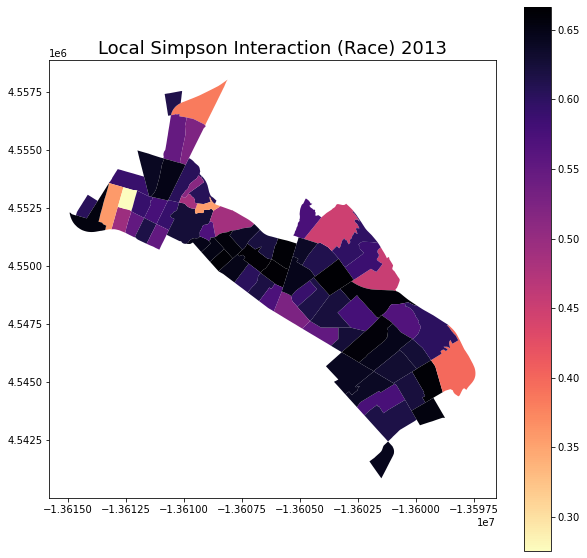

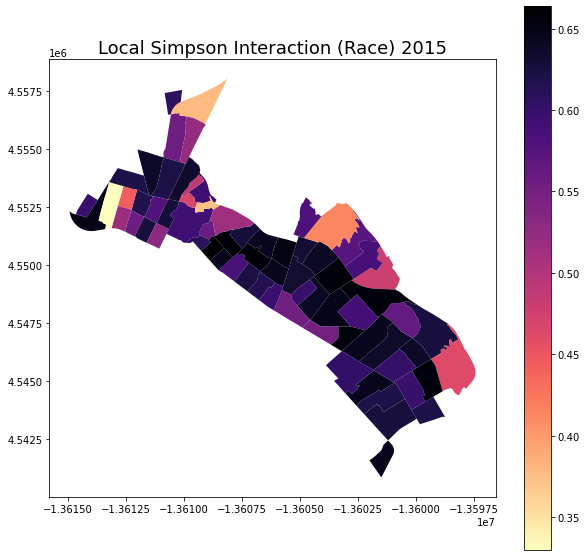

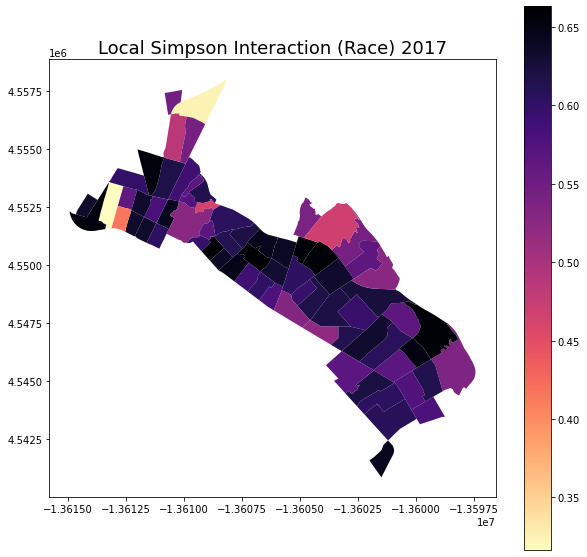

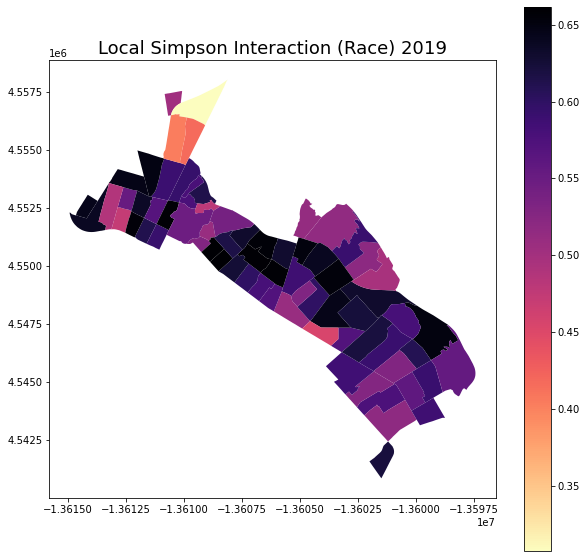

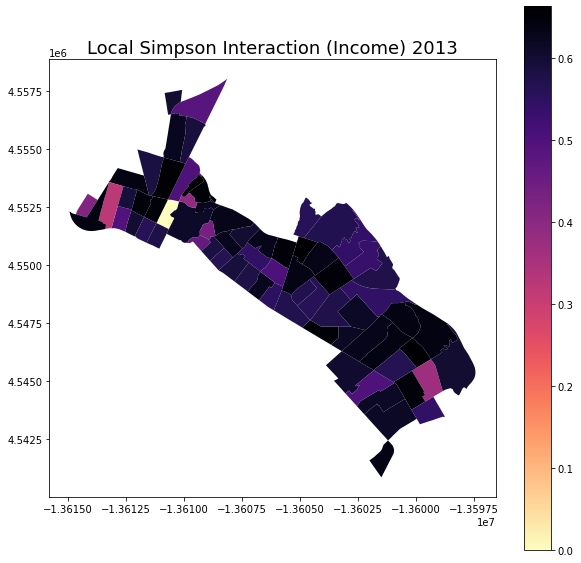

...

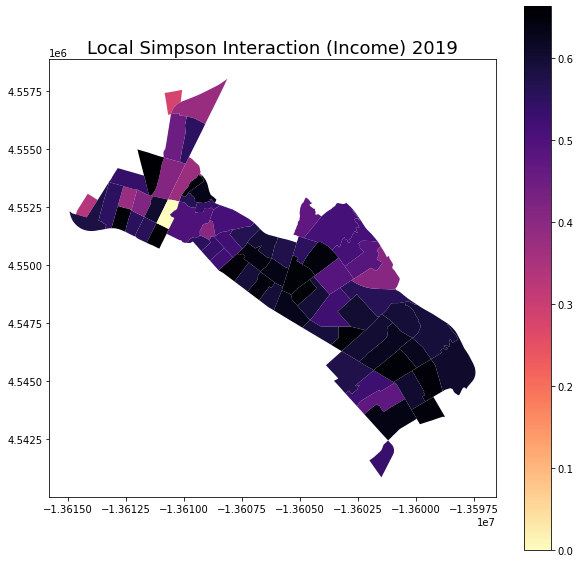

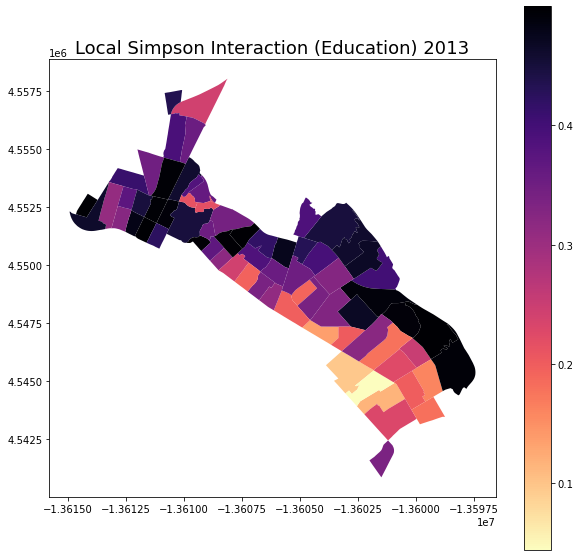

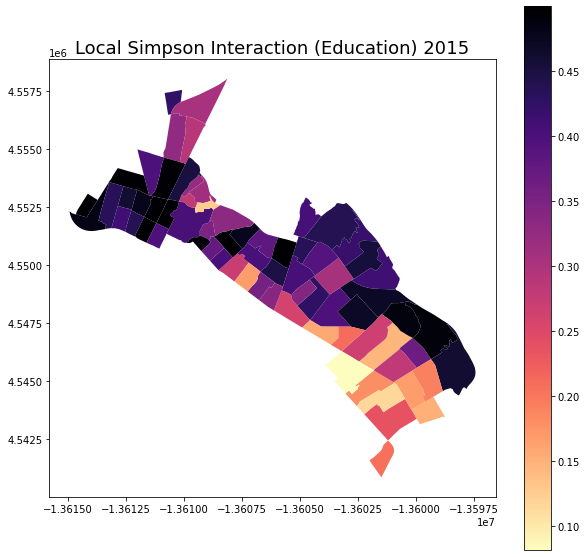

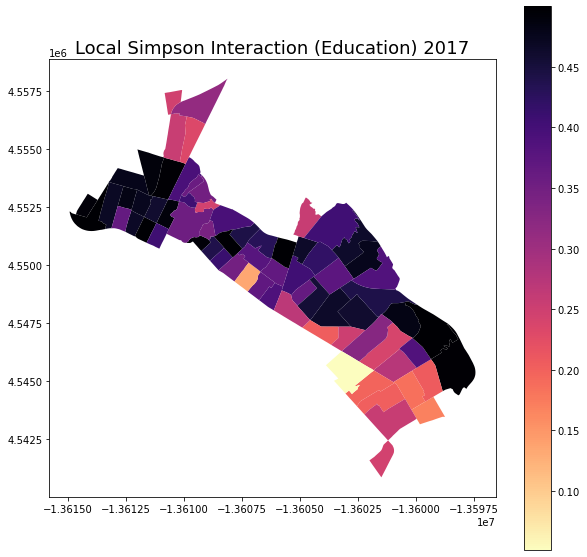

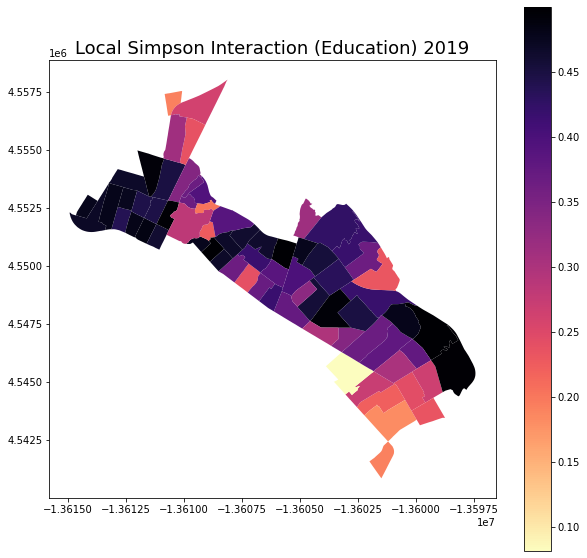

In [48]:
#Race
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.plot(LSI13r.statistics,cmap = 'magma_r',legend = True, ax = ax)
ax.set_title('Local Simpson Interaction (Race) 2013', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.plot(LSI15r.statistics,cmap = 'magma_r',legend = True, ax = ax)
ax.set_title('Local Simpson Interaction (Race) 2015', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.plot(LSI17r.statistics,cmap = 'magma_r',legend = True, ax = ax)
ax.set_title('Local Simpson Interaction (Race) 2017', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.plot(LSI19r.statistics,cmap = 'magma_r',legend = True, ax = ax)
ax.set_title('Local Simpson Interaction (Race) 2019', fontsize = 18)

#Income
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.plot(LSI13i.statistics,cmap = 'magma_r',legend = True, ax = ax)
ax.set_title('Local Simpson Interaction (Income) 2013', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.plot(LSI15i.statistics,cmap = 'magma_r',legend = True, ax = ax)
ax.set_title('Local Simpson Interaction (Income) 2015', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.plot(LSI17i.statistics,cmap = 'magma_r',legend = True, ax = ax)
ax.set_title('Local Simpson Interaction (Income) 2017', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.plot(LSI19i.statistics,cmap = 'magma_r',legend = True, ax = ax)
ax.set_title('Local Simpson Interaction (Income) 2019', fontsize = 18)

#Education
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.plot(LSI13e.statistics,cmap = 'magma_r',legend = True, ax = ax)
ax.set_title('Local Simpson Interaction (Education) 2013', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.plot(LSI15e.statistics,cmap = 'magma_r',legend = True, ax = ax)
ax.set_title('Local Simpson Interaction (Education) 2015', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.plot(LSI17e.statistics,cmap = 'magma_r',legend = True, ax = ax)
ax.set_title('Local Simpson Interaction (Education) 2017', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.plot(LSI19e.statistics,cmap = 'magma_r',legend = True, ax = ax)
ax.set_title('Local Simpson Interaction (Education) 2019', fontsize = 18)

In [25]:
LSC13r = MultiLocalSimpsonConcentration(oakland13, race)
LSC13r.statistics

LSC15r = MultiLocalSimpsonConcentration(oakland15, race)
LSC15r.statistics

LSC17r = MultiLocalSimpsonConcentration(oakland17, race)
LSC17r.statistics

LSC19r = MultiLocalSimpsonConcentration(oakland19, race)
LSC19r.statistics

array([0.38724036, 0.49721069, 0.46989977, 0.40065925, 0.41959686,
       0.41317046, 0.48084667, 0.48933811, 0.48707268, 0.48454468,
       0.4286189 , 0.40872721, 0.3552405 , 0.52687521, 0.44726596,
       0.34424028, 0.35298536, 0.41036209, 0.42231258, 0.69223268,
       0.34056869, 0.48996299, 0.39986766, 0.42314469, 0.36766018,
       0.40501803, 0.33912414, 0.37373218, 0.34360965, 0.36987115,
       0.35400046, 0.47190365, 0.3495246 , 0.36087111, 0.36353613,
       0.34967927, 0.43215283, 0.58279069, 0.36854898, 0.36005365,
       0.4141372 , 0.37946324, 0.4078161 , 0.4813692 , 0.44074616,
       0.39095806, 0.40761331, 0.33858995, 0.34579154, 0.37743152,
       0.50310454, 0.47028999, 0.41927201, 0.40890489, 0.38691799,
       0.52068023, 0.45965241, 0.46977744, 0.34742023, 0.37649998,
       0.41242872, 0.5114583 , 0.34156014, 0.59619365, 0.42019688,
       0.45322909, 0.38342549, 0.42789941, 0.34183011, 0.5451385 ,
       0.44370989])

Text(0.5, 1.0, 'Local Simpson Concentration 2019')

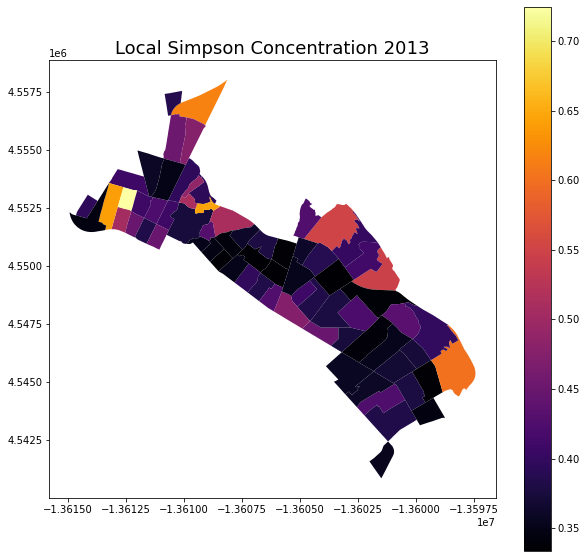

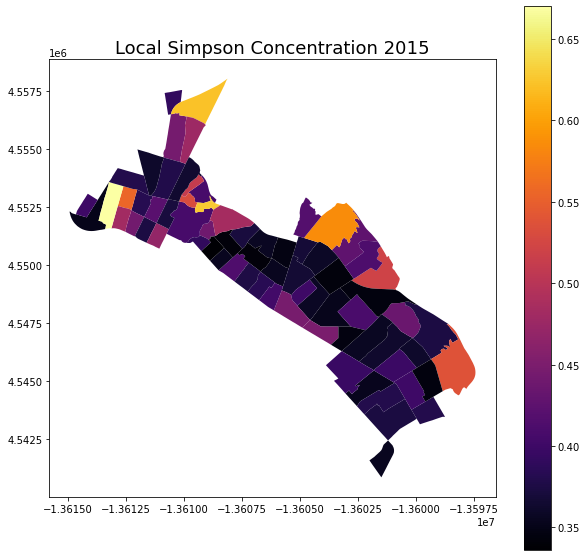

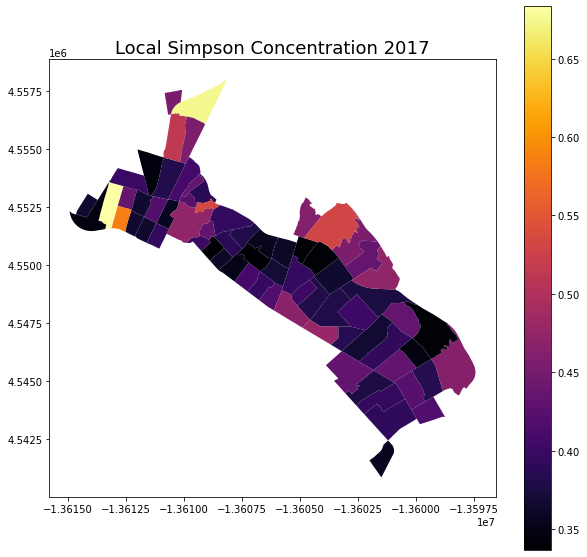

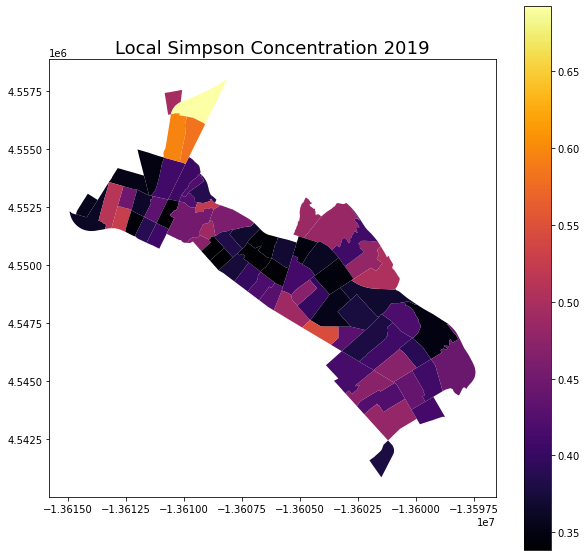

In [26]:
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.plot(LSC13r.statistics,cmap = 'inferno',legend = True, ax = ax)
ax.set_title('Local Simpson Concentration 2013', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.plot(LSC15r.statistics,cmap = 'inferno',legend = True, ax = ax)
ax.set_title('Local Simpson Concentration 2015', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.plot(LSC17r.statistics,cmap = 'inferno',legend = True, ax = ax)
ax.set_title('Local Simpson Concentration 2017', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.plot(LSC19r.statistics,cmap = 'inferno',legend = True, ax = ax)
ax.set_title('Local Simpson Concentration 2019', fontsize = 18)

In [48]:
#Local Centralization
#White
WLRC13 = LocalRelativeCentralization(oakland13, 'B02001_002E', 'B02001_001E')
WLRC13.statistics

WLRC15 = LocalRelativeCentralization(oakland15, 'B02001_002E', 'B02001_001E')
WLRC15.statistics

WLRC17 = LocalRelativeCentralization(oakland17, 'B02001_002E', 'B02001_001E')
WLRC17.statistics

WLRC19 = LocalRelativeCentralization(oakland19, 'B02001_002E', 'B02001_001E')
WLRC19.statistics

#Black
BLRC13 = LocalRelativeCentralization(oakland13, 'B02001_003E', 'B02001_001E')
BLRC13.statistics

BLRC15 = LocalRelativeCentralization(oakland15, 'B02001_003E', 'B02001_001E')
BLRC15.statistics

BLRC17 = LocalRelativeCentralization(oakland17, 'B02001_003E', 'B02001_001E')
LRC17.statistics

BLRC19 = LocalRelativeCentralization(oakland19, 'B02001_003E', 'B02001_001E')
LRC19.statistics

#Hispanic
HLRC13 = LocalRelativeCentralization(oakland13, 'B03001_003E', 'B02001_001E')
HLRC13.statistics

HLRC15 = LocalRelativeCentralization(oakland15, 'B03001_003E', 'B02001_001E')
LRC15.statistics

HLRC17 = LocalRelativeCentralization(oakland17, 'B03001_003E', 'B02001_001E')
HLRC17.statistics

HLRC19 = LocalRelativeCentralization(oakland19, 'B03001_003E', 'B02001_001E')
HLRC19.statistics

array([-0.12527031, -0.14336106,  0.04377523, -0.08557168,  0.25341445,
        0.19210691, -0.02421204,  0.09182996, -0.11452745, -0.04971452,
        0.10724096, -0.05697465,  0.10674189, -0.02195589, -0.03096767,
        0.20435504,  0.0993837 ,  0.06815362,  0.08453586, -0.08766353,
       -0.15293238,  0.17022938,  0.04875016,  0.17691207, -0.34268188,
       -0.01162185,  0.00968787,  0.13352515, -0.04660609, -0.09413068,
        0.02778238,  0.00154949, -0.30704681,  0.08835177, -0.07159115,
        0.10634689,  0.03120718,  0.00200166, -0.03163996,  0.0964868 ,
       -0.02829119,  0.0113752 ,  0.10813199,  0.04696129, -0.08240036,
        0.0722221 , -0.01160463,  0.14204492,  0.0303754 ,  0.05426494,
       -0.24437814, -0.06662804, -0.21230473, -0.00648051,  0.09011908,
       -0.02533638, -0.0229735 ,  0.02036649, -0.0070792 , -0.31585344,
        0.20268679, -0.14191259, -0.0293379 ,  0.04799884,  0.04434997,
       -0.00391736, -0.03768998,  0.07851542,  0.05065781,  0.12

Text(0.5, 1.0, 'Local Centralization for Hispanic 2019')

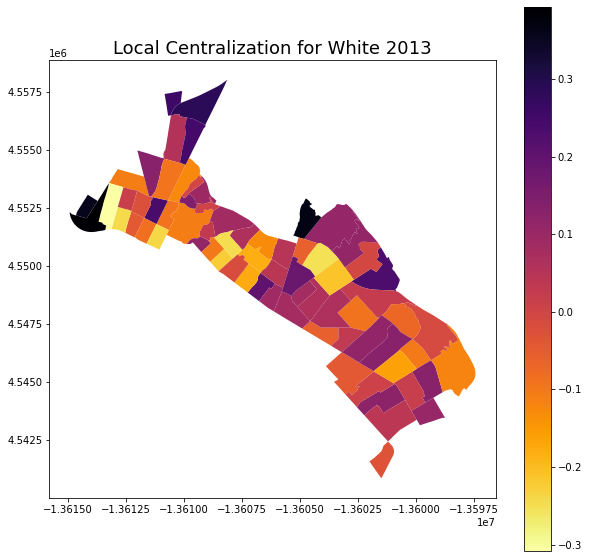

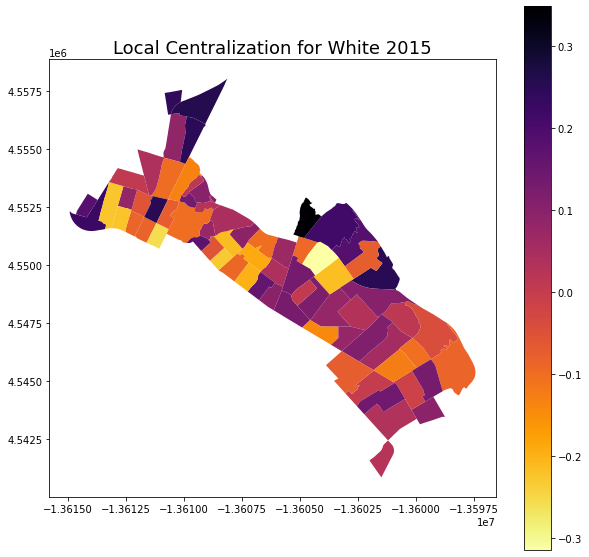

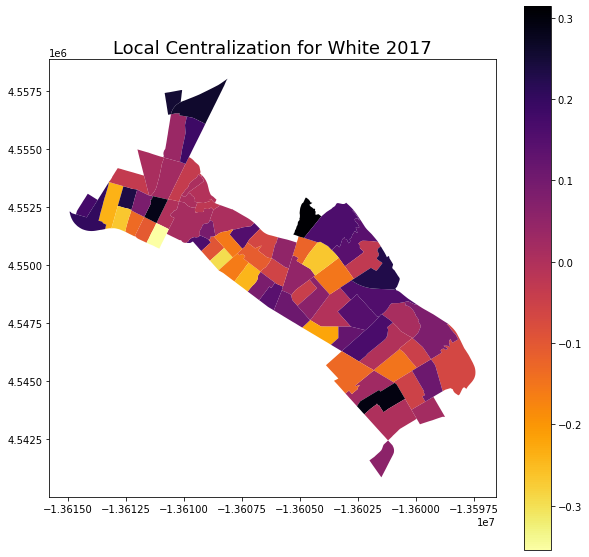

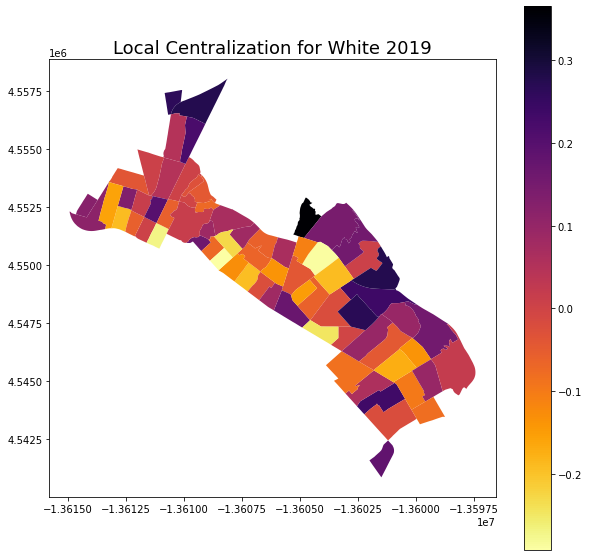

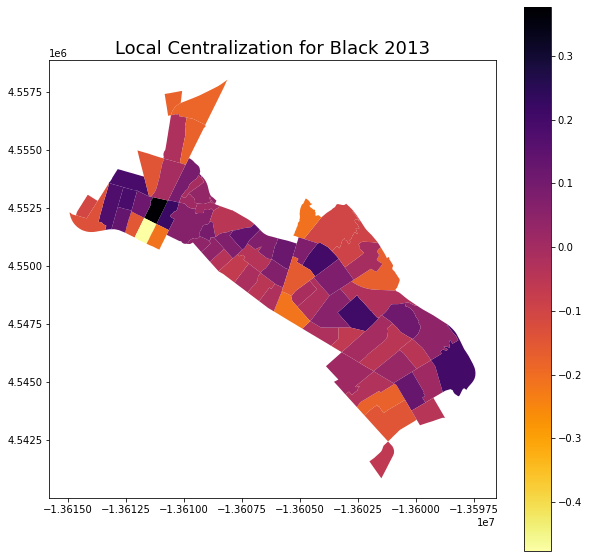

...

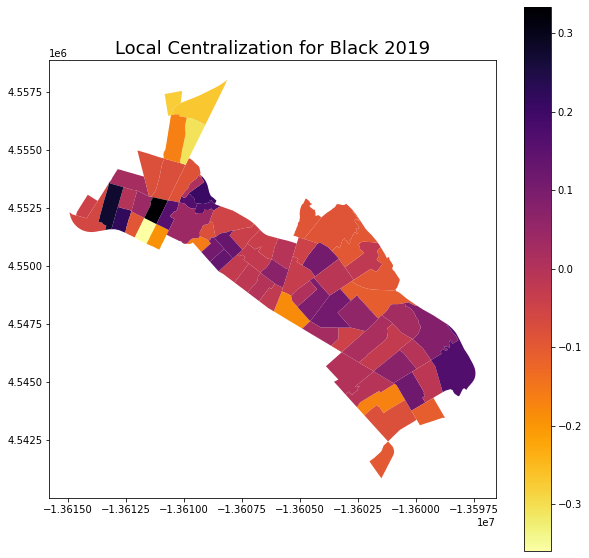

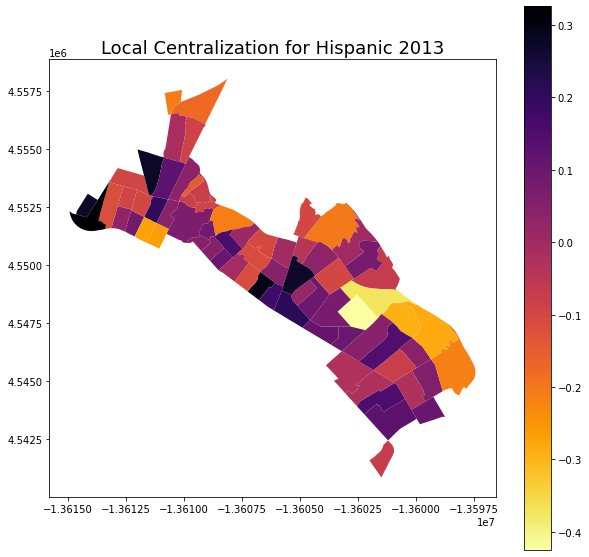

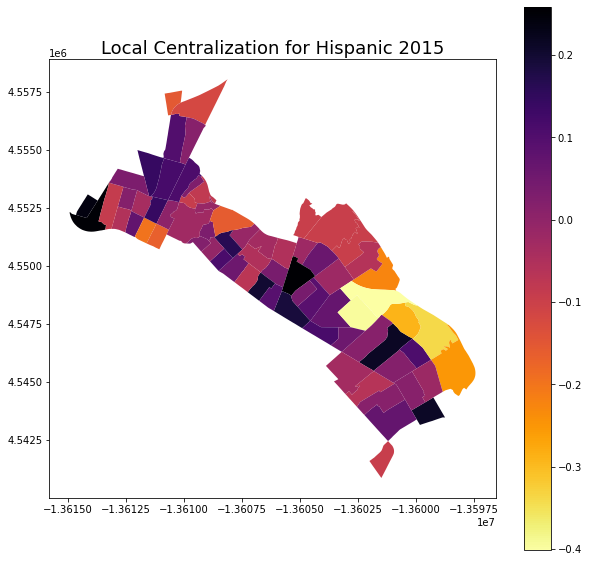

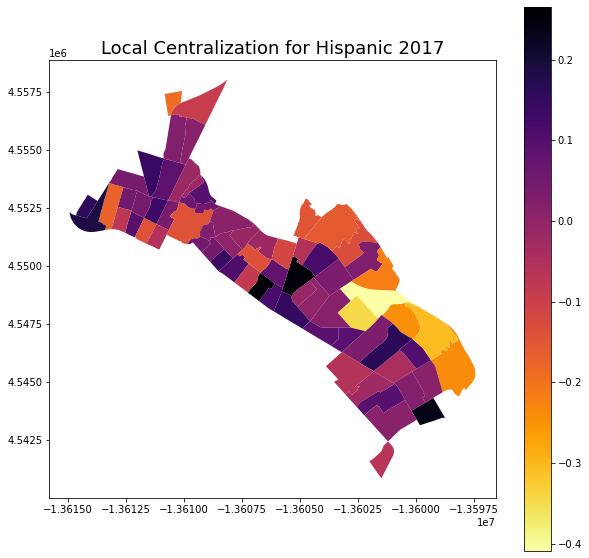

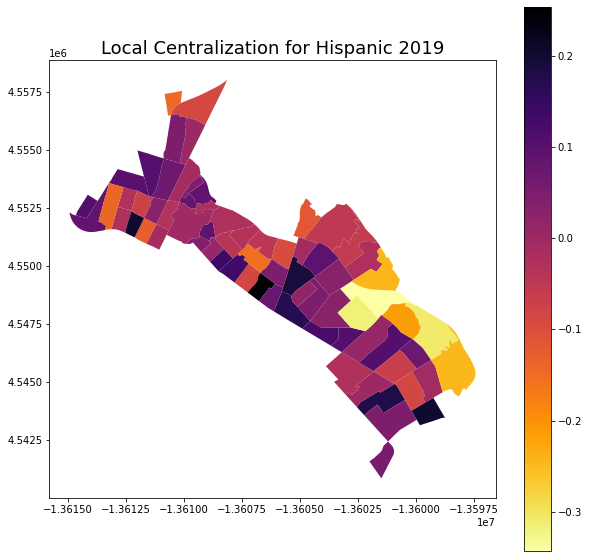

In [49]:
#White
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.plot(WLRC13.statistics,cmap = 'inferno_r',legend = True, ax = ax)
ax.set_title('Local Centralization for White 2013', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.plot(WLRC15.statistics,cmap = 'inferno_r',legend = True, ax = ax)
ax.set_title('Local Centralization for White 2015', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.plot(WLRC17.statistics,cmap = 'inferno_r',legend = True, ax = ax)
ax.set_title('Local Centralization for White 2017', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.plot(WLRC19.statistics,cmap = 'inferno_r',legend = True, ax = ax)
ax.set_title('Local Centralization for White 2019', fontsize = 18)

#Black
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.plot(BLRC13.statistics,cmap = 'inferno_r',legend = True, ax = ax)
ax.set_title('Local Centralization for Black 2013', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.plot(BLRC15.statistics,cmap = 'inferno_r',legend = True, ax = ax)
ax.set_title('Local Centralization for Black 2015', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.plot(BLRC17.statistics,cmap = 'inferno_r',legend = True, ax = ax)
ax.set_title('Local Centralization for Black 2017', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.plot(BLRC19.statistics,cmap = 'inferno_r',legend = True, ax = ax)
ax.set_title('Local Centralization for Black 2019', fontsize = 18)

#Hispanic
f, ax = plt.subplots(1,1,figsize=(10,10))
oakland13.plot(HLRC13.statistics,cmap = 'inferno_r',legend = True, ax = ax)
ax.set_title('Local Centralization for Hispanic 2013', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland15.plot(HLRC15.statistics,cmap = 'inferno_r',legend = True, ax = ax)
ax.set_title('Local Centralization for Hispanic 2015', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland17.plot(HLRC17.statistics,cmap = 'inferno_r',legend = True, ax = ax)
ax.set_title('Local Centralization for Hispanic 2017', fontsize = 18)

f, ax = plt.subplots(1,1,figsize=(10,10))
oakland19.plot(HLRC19.statistics,cmap = 'inferno_r',legend = True, ax = ax)
ax.set_title('Local Centralization for Hispanic 2019', fontsize = 18)
